## Imports

In [1]:
import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
import datetime
warnings.filterwarnings('ignore')
#print(sns.__version__)

## Load Data

Note: Data obtained from various sources (via scraping, manual entry) and compiled into .xlsx format prior to this workstream

In [2]:
#Read file into a DataFrame and print head.
xword_data = pd.ExcelFile('../../NYT_XWord_data_master.xlsx', engine='openpyxl')
print(xword_data.sheet_names)

['Sheet1']


In [3]:
df1 = xword_data.parse('Sheet1')

In [4]:
df1.head(35)

,Puzzle_Date,GMS_Completed,IS1_Completed,IS2_Completed,Completed_Date (IS1),Completed_Date (IS2),Day_of_Week,Time (s) (IS1),Time (s) (IS2),Global_Median_Solver_Time(s),...,90_180_Rot_Sym,LR_UD_Sym,Diag_Sym,Black_Square_Fill,Outside_Grid,Unchecked_Sq,Uniclue,Duplicate_Answers,Quantum,Wordplay
0,2024-03-02,1,1.0,1.0,2024-03-02 08:06:51,2024-03-02 14:20:07,Saturday,758.0,1292.0,1362,...,0,0,0,0,0,0,0,0,0,4.0
1,2019-04-25,1,NaN,1.0,NaT,2024-03-01 17:25:11,Thursday,NaN,952.0,1633,...,0,0,0,0,0,0,0,0,0,2.0
2,2024-03-01,1,1.0,1.0,2024-03-01 07:04:43,2024-03-01 16:59:50,Friday,515.0,609.0,1128,...,0,0,0,0,0,0,0,0,0,4.0
3,2022-05-14,1,1.0,1.0,2022-05-14 10:00:43,2024-02-29 21:50:40,Saturday,947.0,719.0,931,...,0,0,0,0,0,0,0,0,0,2.0
4,2022-05-13,1,1.0,1.0,2022-07-26 14:53:29,2024-02-29 21:31:35,Friday,1283.0,926.0,1317,...,0,0,1,0,0,0,0,0,0,4.0
5,2022-05-12,1,1.0,1.0,2022-05-12 16:56:13,2024-02-29 20:35:49,Thursday,1012.0,880.0,1036,...,0,0,0,0,0,0,0,0,0,1.0
6,2022-05-11,1,1.0,1.0,2022-05-11 09:17:42,2024-02-29 19:58:44,Wednesday,546.0,490.0,719,...,0,0,0,0,0,0,0,0,0,3.0
7,2022-05-10,1,1.0,1.0,2022-05-10 07:40:58,2024-02-29 19:37:53,Tuesday,338.0,253.0,414,...,0,0,0,0,0,0,0,0,0,1.0
8,2022-05-09,1,1.0,1.0,2022-05-09 07:47:13,2024-02-29 19:21:36,Monday,384.0,315.0,434,...,0,0,0,0,0,0,0,0,0,1.0
9,2022-05-08,1,1.0,1.0,2022-05-08 07:52:20,2024-02-29 18:54:46,Sunday,1311.0,997.0,1500,...,0,0,0,0,0,0,0,0,0,3.0


In [5]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2253 entries, 0 to 2252
Data columns (total 72 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Puzzle_Date                   2253 non-null   datetime64[ns]
 1   GMS_Completed                 2253 non-null   int64         
 2   IS1_Completed                 1209 non-null   float64       
 3   IS2_Completed                 1230 non-null   float64       
 4   Completed_Date (IS1)          1209 non-null   datetime64[ns]
 5   Completed_Date (IS2)          1230 non-null   datetime64[ns]
 6   Day_of_Week                   2253 non-null   object        
 7   Time (s) (IS1)                1209 non-null   float64       
 8   Time (s) (IS2)                1230 non-null   float64       
 9   Global_Median_Solver_Time(s)  2253 non-null   int64         
 10  Difficulty                    2253 non-null   object        
 11  Median_Solver%_AVG_PM         

## Data Cleaning and Global Median Solver Feature Creation
A few generally useful operations for the exploratory analysis of Individual Solver 2 (IS2)

In [6]:
# Delete weird columns at the back end of the imported data
#df2 = df1.drop(columns=df1.columns[-6:], axis=1)

In [7]:
# Drop Some columns that, while potentially useful for predictive modeling, aren't necessary for the EDA.
df2 = df1.drop(['Difficulty', '1st_Constructor', '1st_Constuctor_Gender', '1st_Constructor_Puzzle_N', '1st_Constructor_Debut', '1st_Constructor_Scrabble_Avg', '1st_Constructor_Fresh%_Avg', '2nd_Constructor', '2nd_Constuctor_Gender', '2nd_Constructor_Puzzle_N', '2nd_Constructor_Debut', '2nd_Constructor_Scrabble_Avg', '2nd_Constructor_Fresh%_Avg', '3rd_Constructor', '3rd_Constuctor_Gender', '3rd_Constructor_Puzzle_N', '3rd_Constructor_Debut', '3rd_Constructor_Scrabble_Avg', '3rd_Constructor_Fresh%_Avg', 'Spans', '2_Stacks', '3_4_Stacks', 'Mirror_Sym', 'UD_Sym', 'Asym', 'Supersym', '90_180_Rot_Sym', 'LR_UD_Sym', 'Diag_Sym', 'Black_Square_Fill','Outside_Grid', 'Unchecked_Sq','Uniclue','Duplicate_Answers','Quantum'], axis=1)

In [8]:
# Rename some columns for brevity and clarity
df2.rename(columns={'Constructors(by seniority)': 'Constructors', 'Median_Solver%_AVG_PM':'Diff%_from_10pMA(GMS)', 'Day_of_Week': 'DOW', 'Puzzle_Date': 'P_Date', 'Median_Solver%_AVG_PM': 'GMST_Diff%_from_GMS_10p_MA'}, inplace=True)

In [9]:
# It will be useful generally to have puzzle dates as strings in other columns along with the datetimes 
df2['P_Date_str'] = df2['P_Date'].dt.strftime('%Y-%m-%d') #we want datetime as a string to index into here

In [10]:
# Convert global median solve times (GMTs) per puzzle to minutes and drop times in seconds
df2["GMST(m)"] = df2["Global_Median_Solver_Time(s)"]/60  #GMST = Global Median solve times
df2.drop(['Global_Median_Solver_Time(s)'], axis=1, inplace=True)

In [11]:
#GMS_pds_l40_dw
#Provides decay-weighted(dw), puzzle day-specific (pds) mean solve time performance for GMS over the previous 40 puzzles relative to a given puzzle
# Note also that, unlike the 10-puzzle moving average, this weighted average does NOT include the "puzzle at hand" itself

df2 = df2.sort_values(by=['DOW', 'P_Date'], ascending = False)

# Gradual decay
w = np.arange(1,41)
w = list(w)

# No decay
# w = np.ones(40)
# w = list(w)

df2["GMS_pds_l40_dw_1"] = df2.groupby(['DOW'])['GMST(m)'].shift(-1)*w[0]
df2["GMS_pds_l40_dw_2"] = df2.groupby(['DOW'])['GMST(m)'].shift(-2)*w[1]
df2["GMS_pds_l40_dw_3"] = df2.groupby(['DOW'])['GMST(m)'].shift(-3)*w[2]
df2["GMS_pds_l40_dw_4"] = df2.groupby(['DOW'])['GMST(m)'].shift(-4)*w[3]
df2["GMS_pds_l40_dw_5"] = df2.groupby(['DOW'])['GMST(m)'].shift(-5)*w[4]
df2["GMS_pds_l40_dw_6"] = df2.groupby(['DOW'])['GMST(m)'].shift(-6)*w[5]
df2["GMS_pds_l40_dw_7"] = df2.groupby(['DOW'])['GMST(m)'].shift(-7)*w[6]
df2["GMS_pds_l40_dw_8"] = df2.groupby(['DOW'])['GMST(m)'].shift(-8)*w[7]
df2["GMS_pds_l40_dw_9"] = df2.groupby(['DOW'])['GMST(m)'].shift(-9)*w[8]
df2["GMS_pds_l40_dw_10"] = df2.groupby(['DOW'])['GMST(m)'].shift(-10)*w[9]
df2["GMS_pds_l40_dw_11"] = df2.groupby(['DOW'])['GMST(m)'].shift(-11)*w[10]
df2["GMS_pds_l40_dw_12"] = df2.groupby(['DOW'])['GMST(m)'].shift(-12)*w[11]
df2["GMS_pds_l40_dw_13"] = df2.groupby(['DOW'])['GMST(m)'].shift(-13)*w[12]
df2["GMS_pds_l40_dw_14"] = df2.groupby(['DOW'])['GMST(m)'].shift(-14)*w[13]
df2["GMS_pds_l40_dw_15"] = df2.groupby(['DOW'])['GMST(m)'].shift(-15)*w[14]
df2["GMS_pds_l40_dw_16"] = df2.groupby(['DOW'])['GMST(m)'].shift(-16)*w[15]
df2["GMS_pds_l40_dw_17"] = df2.groupby(['DOW'])['GMST(m)'].shift(-17)*w[16]
df2["GMS_pds_l40_dw_18"] = df2.groupby(['DOW'])['GMST(m)'].shift(-18)*w[17]
df2["GMS_pds_l40_dw_19"] = df2.groupby(['DOW'])['GMST(m)'].shift(-19)*w[18]
df2["GMS_pds_l40_dw_20"] = df2.groupby(['DOW'])['GMST(m)'].shift(-20)*w[19]
df2["GMS_pds_l40_dw_21"] = df2.groupby(['DOW'])['GMST(m)'].shift(-21)*w[20]
df2["GMS_pds_l40_dw_22"] = df2.groupby(['DOW'])['GMST(m)'].shift(-22)*w[21]
df2["GMS_pds_l40_dw_23"] = df2.groupby(['DOW'])['GMST(m)'].shift(-23)*w[22]
df2["GMS_pds_l40_dw_24"] = df2.groupby(['DOW'])['GMST(m)'].shift(-24)*w[23]
df2["GMS_pds_l40_dw_25"] = df2.groupby(['DOW'])['GMST(m)'].shift(-25)*w[24]
df2["GMS_pds_l40_dw_26"] = df2.groupby(['DOW'])['GMST(m)'].shift(-26)*w[25]
df2["GMS_pds_l40_dw_27"] = df2.groupby(['DOW'])['GMST(m)'].shift(-27)*w[26]
df2["GMS_pds_l40_dw_28"] = df2.groupby(['DOW'])['GMST(m)'].shift(-28)*w[27]
df2["GMS_pds_l40_dw_29"] = df2.groupby(['DOW'])['GMST(m)'].shift(-29)*w[28]
df2["GMS_pds_l40_dw_30"] = df2.groupby(['DOW'])['GMST(m)'].shift(-30)*w[29]
df2["GMS_pds_l40_dw_31"] = df2.groupby(['DOW'])['GMST(m)'].shift(-31)*w[30]
df2["GMS_pds_l40_dw_32"] = df2.groupby(['DOW'])['GMST(m)'].shift(-32)*w[31]
df2["GMS_pds_l40_dw_33"] = df2.groupby(['DOW'])['GMST(m)'].shift(-33)*w[32]
df2["GMS_pds_l40_dw_34"] = df2.groupby(['DOW'])['GMST(m)'].shift(-34)*w[33]
df2["GMS_pds_l40_dw_35"] = df2.groupby(['DOW'])['GMST(m)'].shift(-35)*w[34]
df2["GMS_pds_l40_dw_36"] = df2.groupby(['DOW'])['GMST(m)'].shift(-36)*w[35]
df2["GMS_pds_l40_dw_37"] = df2.groupby(['DOW'])['GMST(m)'].shift(-37)*w[36]
df2["GMS_pds_l40_dw_38"] = df2.groupby(['DOW'])['GMST(m)'].shift(-38)*w[37]
df2["GMS_pds_l40_dw_39"] = df2.groupby(['DOW'])['GMST(m)'].shift(-39)*w[38]
df2["GMS_pds_l40_dw_40"] = df2.groupby(['DOW'])['GMST(m)'].shift(-40)*w[39]


df2["GMS_pds_l40_dw_1_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-1)/df2.groupby(['DOW'])['GMST(m)'].shift(-1))*w[0]
df2["GMS_pds_l40_dw_2_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-2)/df2.groupby(['DOW'])['GMST(m)'].shift(-2))*w[1]
df2["GMS_pds_l40_dw_3_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-3)/df2.groupby(['DOW'])['GMST(m)'].shift(-3))*w[2]
df2["GMS_pds_l40_dw_4_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-4)/df2.groupby(['DOW'])['GMST(m)'].shift(-4))*w[3]
df2["GMS_pds_l40_dw_5_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-5)/df2.groupby(['DOW'])['GMST(m)'].shift(-5))*w[4]
df2["GMS_pds_l40_dw_6_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-6)/df2.groupby(['DOW'])['GMST(m)'].shift(-6))*w[5]
df2["GMS_pds_l40_dw_7_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-7)/df2.groupby(['DOW'])['GMST(m)'].shift(-7))*w[6]
df2["GMS_pds_l40_dw_8_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-8)/df2.groupby(['DOW'])['GMST(m)'].shift(-8))*w[7]
df2["GMS_pds_l40_dw_9_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-9)/df2.groupby(['DOW'])['GMST(m)'].shift(-9))*w[8]
df2["GMS_pds_l40_dw_10_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-10)/df2.groupby(['DOW'])['GMST(m)'].shift(-10))*w[9]
df2["GMS_pds_l40_dw_11_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-11)/df2.groupby(['DOW'])['GMST(m)'].shift(-11))*w[10]
df2["GMS_pds_l40_dw_12_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-12)/df2.groupby(['DOW'])['GMST(m)'].shift(-12))*w[11]
df2["GMS_pds_l40_dw_13_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-13)/df2.groupby(['DOW'])['GMST(m)'].shift(-13))*w[12]
df2["GMS_pds_l40_dw_14_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-14)/df2.groupby(['DOW'])['GMST(m)'].shift(-14))*w[13]
df2["GMS_pds_l40_dw_15_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-15)/df2.groupby(['DOW'])['GMST(m)'].shift(-15))*w[14]
df2["GMS_pds_l40_dw_16_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-16)/df2.groupby(['DOW'])['GMST(m)'].shift(-16))*w[15]
df2["GMS_pds_l40_dw_17_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-17)/df2.groupby(['DOW'])['GMST(m)'].shift(-17))*w[16]
df2["GMS_pds_l40_dw_18_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-18)/df2.groupby(['DOW'])['GMST(m)'].shift(-18))*w[17]
df2["GMS_pds_l40_dw_19_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-19)/df2.groupby(['DOW'])['GMST(m)'].shift(-19))*w[18]
df2["GMS_pds_l40_dw_20_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-20)/df2.groupby(['DOW'])['GMST(m)'].shift(-20))*w[19]
df2["GMS_pds_l40_dw_21_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-21)/df2.groupby(['DOW'])['GMST(m)'].shift(-21))*w[20]
df2["GMS_pds_l40_dw_22_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-22)/df2.groupby(['DOW'])['GMST(m)'].shift(-22))*w[21]
df2["GMS_pds_l40_dw_23_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-23)/df2.groupby(['DOW'])['GMST(m)'].shift(-23))*w[22]
df2["GMS_pds_l40_dw_24_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-24)/df2.groupby(['DOW'])['GMST(m)'].shift(-24))*w[23]
df2["GMS_pds_l40_dw_25_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-25)/df2.groupby(['DOW'])['GMST(m)'].shift(-25))*w[24]
df2["GMS_pds_l40_dw_26_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-26)/df2.groupby(['DOW'])['GMST(m)'].shift(-26))*w[25]
df2["GMS_pds_l40_dw_27_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-27)/df2.groupby(['DOW'])['GMST(m)'].shift(-27))*w[26]
df2["GMS_pds_l40_dw_28_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-28)/df2.groupby(['DOW'])['GMST(m)'].shift(-28))*w[27]
df2["GMS_pds_l40_dw_29_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-29)/df2.groupby(['DOW'])['GMST(m)'].shift(-29))*w[28]
df2["GMS_pds_l40_dw_30_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-30)/df2.groupby(['DOW'])['GMST(m)'].shift(-30))*w[29]
df2["GMS_pds_l40_dw_31_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-31)/df2.groupby(['DOW'])['GMST(m)'].shift(-31))*w[30]
df2["GMS_pds_l40_dw_32_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-32)/df2.groupby(['DOW'])['GMST(m)'].shift(-32))*w[31]
df2["GMS_pds_l40_dw_33_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-33)/df2.groupby(['DOW'])['GMST(m)'].shift(-33))*w[32]
df2["GMS_pds_l40_dw_34_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-34)/df2.groupby(['DOW'])['GMST(m)'].shift(-34))*w[33]
df2["GMS_pds_l40_dw_35_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-35)/df2.groupby(['DOW'])['GMST(m)'].shift(-35))*w[34]
df2["GMS_pds_l40_dw_36_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-36)/df2.groupby(['DOW'])['GMST(m)'].shift(-36))*w[35]
df2["GMS_pds_l40_dw_37_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-37)/df2.groupby(['DOW'])['GMST(m)'].shift(-37))*w[36]
df2["GMS_pds_l40_dw_38_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-38)/df2.groupby(['DOW'])['GMST(m)'].shift(-38))*w[37]
df2["GMS_pds_l40_dw_39_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-39)/df2.groupby(['DOW'])['GMST(m)'].shift(-39))*w[38]
df2["GMS_pds_l40_dw_40_ct"] = (df2.groupby(['DOW'])['GMST(m)'].shift(-40)/df2.groupby(['DOW'])['GMST(m)'].shift(-40))*w[39]


df2["GMS_pds_l40_ws"] = df2[["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25",
                            "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40"]].sum(axis=1)
df2["GMS_pds_l40_ws_ct"] = df2[["GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct",
                               "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct"]].sum(axis=1)
df2["GMS_pds_l40_dw"] = df2["GMS_pds_l40_ws"]/df2["GMS_pds_l40_ws_ct"]

# Deleting transient columns
df2 = df2.drop(["GMS_pds_l40_dw_1", "GMS_pds_l40_dw_2", "GMS_pds_l40_dw_3", "GMS_pds_l40_dw_4", "GMS_pds_l40_dw_5", "GMS_pds_l40_dw_6", "GMS_pds_l40_dw_7", "GMS_pds_l40_dw_8", "GMS_pds_l40_dw_9", "GMS_pds_l40_dw_10", "GMS_pds_l40_dw_11", "GMS_pds_l40_dw_12", "GMS_pds_l40_dw_13", "GMS_pds_l40_dw_14", "GMS_pds_l40_dw_15", "GMS_pds_l40_dw_16", "GMS_pds_l40_dw_17", "GMS_pds_l40_dw_18", "GMS_pds_l40_dw_19", "GMS_pds_l40_dw_20", "GMS_pds_l40_dw_21", "GMS_pds_l40_dw_22", "GMS_pds_l40_dw_23", "GMS_pds_l40_dw_24", "GMS_pds_l40_dw_25", "GMS_pds_l40_dw_26", "GMS_pds_l40_dw_27", "GMS_pds_l40_dw_28", "GMS_pds_l40_dw_29", "GMS_pds_l40_dw_30", "GMS_pds_l40_dw_31", "GMS_pds_l40_dw_32", "GMS_pds_l40_dw_33", "GMS_pds_l40_dw_34", "GMS_pds_l40_dw_35", "GMS_pds_l40_dw_36", "GMS_pds_l40_dw_37", "GMS_pds_l40_dw_38", "GMS_pds_l40_dw_39", "GMS_pds_l40_dw_40",  
                "GMS_pds_l40_dw_1_ct", "GMS_pds_l40_dw_2_ct", "GMS_pds_l40_dw_3_ct", "GMS_pds_l40_dw_4_ct", "GMS_pds_l40_dw_5_ct", "GMS_pds_l40_dw_6_ct", "GMS_pds_l40_dw_7_ct", "GMS_pds_l40_dw_8_ct", "GMS_pds_l40_dw_9_ct", "GMS_pds_l40_dw_10_ct", "GMS_pds_l40_dw_11_ct", "GMS_pds_l40_dw_12_ct", "GMS_pds_l40_dw_13_ct", "GMS_pds_l40_dw_14_ct", "GMS_pds_l40_dw_15_ct", "GMS_pds_l40_dw_16_ct", "GMS_pds_l40_dw_17_ct", "GMS_pds_l40_dw_18_ct", "GMS_pds_l40_dw_19_ct", "GMS_pds_l40_dw_20_ct", "GMS_pds_l40_dw_21_ct", "GMS_pds_l40_dw_22_ct", "GMS_pds_l40_dw_23_ct", "GMS_pds_l40_dw_24_ct", "GMS_pds_l40_dw_25_ct", "GMS_pds_l40_dw_26_ct", "GMS_pds_l40_dw_27_ct", "GMS_pds_l40_dw_28_ct", "GMS_pds_l40_dw_29_ct", "GMS_pds_l40_dw_30_ct", "GMS_pds_l40_dw_31_ct", "GMS_pds_l40_dw_32_ct", "GMS_pds_l40_dw_33_ct", "GMS_pds_l40_dw_34_ct", "GMS_pds_l40_dw_35_ct", "GMS_pds_l40_dw_36_ct", "GMS_pds_l40_dw_37_ct", "GMS_pds_l40_dw_38_ct", "GMS_pds_l40_dw_39_ct", "GMS_pds_l40_dw_40_ct",
                "GMS_pds_l40_ws", "GMS_pds_l40_ws_ct"], axis = 1)

In [12]:
# Calculate 10-puzzle moving average for global median solver (GMS) raw solve times, within Day of Week
# Unlike for Individual Solvers (see below), we do NOT have completion dates for median solver per puzzle. It is therefore assumed that completion date tracks with puzzle date (obviously not always going to be true, but approximates true closely enough for our purposes)
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = True)
df2['GMST(m)_10p_MA'] = df2.groupby('DOW')['GMST(m)'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))
df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [13]:
# Calculate deviation from GMS_pds_l40_dw for GMS
df2['GMST_Diff%_from_GMS_pds_l40_dw'] = (((df2['GMST(m)'] - df2['GMS_pds_l40_dw']))/((df2['GMST(m)'] + df2['GMS_pds_l40_dw'])/2)*100).round(2)

df2 = df2.sort_values(by=['DOW','P_Date'], ascending = False)

In [14]:
# It will be useful to have year of puzzle issue in a separate column for analysis below
df2['P_Yr'] = df2['P_Date'].dt.to_period('Y')
df2['P_Yr'].value_counts()

2020    366
2023    365
2021    365
2019    365
2022    365
2018    365
2024     62
Freq: A-DEC, Name: P_Yr, dtype: int64

In [15]:
# Also, a column indicating pre-2023 puzzle issue date or 2023-2024 puzzle issue date
df2.loc[(df2["P_Yr"] != "2023") & (df2["P_Yr"] != "2024"), "2023+_puzzle"] = 0 #pre-2023 puzzle issue date
df2.loc[(df2["P_Yr"] == "2023") | (df2["P_Yr"] == "2024"), "2023+_puzzle"] = 1 #2023 or 2024 puzzle issue date
df2['2023+_puzzle'].value_counts()

0.0    1826
1.0     427
Name: 2023+_puzzle, dtype: int64

In [16]:
# A numerical column for puzzle day that starts with Sunday and ends with Saturday
df2.loc[(df2["DOW"] == "Sunday"), "DOW_num"] = 1 
df2.loc[(df2["DOW"] == "Monday"), "DOW_num"] = 2
df2.loc[(df2["DOW"] == "Tuesday"), "DOW_num"] = 3
df2.loc[(df2["DOW"] == "Wednesday"), "DOW_num"] = 4
df2.loc[(df2["DOW"] == "Thursday"), "DOW_num"] = 5
df2.loc[(df2["DOW"] == "Friday"), "DOW_num"] = 6
df2.loc[(df2["DOW"] == "Saturday"), "DOW_num"] = 7

In [17]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2253 entries, 18 to 2248
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2253 non-null   datetime64[ns]
 1   GMS_Completed                   2253 non-null   int64         
 2   IS1_Completed                   1209 non-null   float64       
 3   IS2_Completed                   1230 non-null   float64       
 4   Completed_Date (IS1)            1209 non-null   datetime64[ns]
 5   Completed_Date (IS2)            1230 non-null   datetime64[ns]
 6   DOW                             2253 non-null   object        
 7   Time (s) (IS1)                  1209 non-null   float64       
 8   Time (s) (IS2)                  1230 non-null   float64       
 9   GMST_Diff%_from_GMS_10p_MA      2253 non-null   int64         
 10  Grid Size                       2253 non-null   int64         
 11  No_

In [18]:
# Move new columns to logical places in dataframe
col = df2.pop('P_Date_str')
df2.insert(1, col.name, col)

col = df2.pop('P_Yr')
df2.insert(2, col.name, col)

col = df2.pop('2023+_puzzle')
df2.insert(3, col.name, col)

col = df2.pop('DOW')
df2.insert(4, col.name, col)

col = df2.pop('DOW_num')
df2.insert(5, col.name, col)

col = df2.pop('GMST(m)')
df2.insert(6, col.name, col)

col = df2.pop('GMST(m)_10p_MA')
df2.insert(7, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_10p_MA')
df2.insert(8, col.name, col)

col = df2.pop('GMS_pds_l40_dw')
df2.insert(9, col.name, col)

col = df2.pop('GMST_Diff%_from_GMS_pds_l40_dw')
df2.insert(10, col.name, col)

In [19]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2253 entries, 18 to 2248
Data columns (total 44 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          2253 non-null   datetime64[ns]
 1   P_Date_str                      2253 non-null   object        
 2   P_Yr                            2253 non-null   period[A-DEC] 
 3   2023+_puzzle                    2253 non-null   float64       
 4   DOW                             2253 non-null   object        
 5   DOW_num                         2253 non-null   float64       
 6   GMST(m)                         2253 non-null   float64       
 7   GMST(m)_10p_MA                  2239 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      2253 non-null   int64         
 9   GMS_pds_l40_dw                  2246 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  2246 non-null   float64       
 11  GMS

In [20]:
# Checkpoint
df2.to_csv('../data/df2.csv', index=False)

## Individual Solver 2 (IS2) Data Cleaning and Feature Creation

In [21]:
# Keep only puzzles for which IS2 has a solve time, and drop columns specific to Individual Solver 1 (IS1)
df_IS2 = df2.dropna(subset=['IS2_Completed'])
df_IS2.drop(["Completed_Date (IS1)", "Time (s) (IS1)", "GMS_Completed", "IS1_Completed", "IS2_Completed"], axis = 1, inplace=True)

In [22]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 18 to 507
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1230 non-null   datetime64[ns]
 1   P_Date_str                      1230 non-null   object        
 2   P_Yr                            1230 non-null   period[A-DEC] 
 3   2023+_puzzle                    1230 non-null   float64       
 4   DOW                             1230 non-null   object        
 5   DOW_num                         1230 non-null   float64       
 6   GMST(m)                         1230 non-null   float64       
 7   GMST(m)_10p_MA                  1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1230 non-null   int64         
 9   GMS_pds_l40_dw                  1230 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1230 non-null   float64       
 11  Comp

In [23]:
df_IS2.head()

,P_Date,P_Date_str,P_Yr,2023+_puzzle,DOW,DOW_num,GMST(m),GMST(m)_10p_MA,GMST_Diff%_from_GMS_10p_MA,GMS_pds_l40_dw,...,Scrabble_Illegal,Open_Squares,Freshness_Factor,Overall_Freshness%,Day_Freshness%,Duplicate_Clues,Circle_Count,Shade_Count,Unusual_Sym,Wordplay
18,2024-02-28,2024-02-28,2024,1.0,Wednesday,4.0,7.933333,11.300000,-38,11.383313,...,25,69,23.6,11.5,14.9,0,0,0,0,3.0
42,2024-02-21,2024-02-21,2024,1.0,Wednesday,4.0,9.200000,11.903333,-28,11.545650,...,33,78,29.5,296.0,46.9,0,0,0,0,2.0
76,2024-02-14,2024-02-14,2024,1.0,Wednesday,4.0,13.916667,11.901667,6,11.450508,...,35,66,43.0,72.9,96.1,0,0,0,1,2.0
105,2024-02-07,2024-02-07,2024,1.0,Wednesday,4.0,11.900000,11.850000,-5,11.583069,...,31,72,29.5,29.3,46.0,0,0,0,0,2.0
134,2024-01-31,2024-01-31,2024,1.0,Wednesday,4.0,10.866667,11.536667,-12,11.712541,...,33,67,29.4,28.7,44.4,0,0,17,0,5.0


In [24]:
# It will be useful to have IS2 puzzle completion dates as strings in other columns along with the datetimes 
df_IS2['Comp_Date_str'] = df_IS2['Completed_Date (IS2)'].dt.strftime('%Y-%m-%d') #we want datetime as a string to index into here

In [25]:
# Convert Individual Solver1 (IS2) solve times per puzzle to minutes and drop times in seconds
df_IS2["IST(m)"] = df_IS2["Time (s) (IS2)"]/60   #IST = Individual solver times 
df_IS2.drop(['Time (s) (IS2)'], axis=1, inplace=True)

In [26]:
# It will be useful to have year of puzzle completion for this solver in a separate column for analysis below
df_IS2['Comp_Yr'] = df_IS2['Completed_Date (IS2)'].dt.to_period('Y')
df_IS2['Comp_Yr'].value_counts()

2023    499
2020    282
2024    244
2018     89
2022     79
2021     28
2019      9
Freq: A-DEC, Name: Comp_Yr, dtype: int64

In [27]:
# Also, a column indicating pre-2023 solve or 2023/204 solve
df_IS2.loc[(df_IS2["Comp_Yr"] == "2023") | (df_IS2["Comp_Yr"] == "2024"), "2023+_solve"] = 1 #2023_2024 solve
df_IS2.loc[(df_IS2["Comp_Yr"] != "2023") & (df_IS2["Comp_Yr"] != "2024"), "2023+_solve"] = 0 #pre-2023 solve
df_IS2['2023+_solve'].value_counts()

1.0    743
0.0    487
Name: 2023+_solve, dtype: int64

In [28]:
# Rename a column for brevity and clarity
df_IS2.rename(columns={'Completed_Date (IS2)': 'Comp_Date'}, inplace=True)

In [29]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 18 to 507
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1230 non-null   datetime64[ns]
 1   P_Date_str                      1230 non-null   object        
 2   P_Yr                            1230 non-null   period[A-DEC] 
 3   2023+_puzzle                    1230 non-null   float64       
 4   DOW                             1230 non-null   object        
 5   DOW_num                         1230 non-null   float64       
 6   GMST(m)                         1230 non-null   float64       
 7   GMST(m)_10p_MA                  1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1230 non-null   int64         
 9   GMS_pds_l40_dw                  1230 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1230 non-null   float64       
 11  Comp

In [30]:
# Move new columns to logical places in dataframe
col = df_IS2.pop('Comp_Date_str')
df_IS2.insert(12, col.name, col)

col = df_IS2.pop('Comp_Yr')
df_IS2.insert(13, col.name, col)

col = df_IS2.pop('2023+_solve')
df_IS2.insert(14, col.name, col)

col = df_IS2.pop('IST(m)')
df_IS2.insert(15, col.name, col)

In [31]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 18 to 507
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1230 non-null   datetime64[ns]
 1   P_Date_str                      1230 non-null   object        
 2   P_Yr                            1230 non-null   period[A-DEC] 
 3   2023+_puzzle                    1230 non-null   float64       
 4   DOW                             1230 non-null   object        
 5   DOW_num                         1230 non-null   float64       
 6   GMST(m)                         1230 non-null   float64       
 7   GMST(m)_10p_MA                  1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1230 non-null   int64         
 9   GMS_pds_l40_dw                  1230 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1230 non-null   float64       
 11  Comp

## Feature Calculations

In [32]:
# Calculate 10-puzzle moving average for individual solver (IS2) raw solve times, per Day of Week
#Unlike for GMS, we DO have completion dates for individual solver per puzzle. Therefore we use completion date, not puzzle date
df_IS2 = df_IS2.sort_values(by=['DOW','Comp_Date'], ascending = True)
df_IS2['IST(m)_10p_MA'] = df_IS2.groupby('DOW')['IST(m)'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))
df_IS2 = df_IS2.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [33]:
#IS_pds_l10_dw
#Provides decay-weighted(dw), puzzle day-specific (pds) mean solve time performance for IS2 over the previous 10 puzzles relative to a given puzzle
# Note that the sort is by completion date for IS2, as completion date was avaiable 
# Note also that, unlike the 10-puzzle moving average, this weighted average does NOT include the "puzzle at hand" itself

df_IS2 = df_IS2.sort_values(by=['DOW', 'Comp_Date'], ascending = False)

# Gradual decay
# w = np.arange(1,11)
# w = list(w)

# No decay
w = np.ones(10)
w = list(w)

df_IS2["IS_pds_l10_dw_1"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-1)*w[0]
df_IS2["IS_pds_l10_dw_2"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-2)*w[1]
df_IS2["IS_pds_l10_dw_3"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-3)*w[2]
df_IS2["IS_pds_l10_dw_4"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-4)*w[3]
df_IS2["IS_pds_l10_dw_5"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-5)*w[4]
df_IS2["IS_pds_l10_dw_6"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-6)*w[5]
df_IS2["IS_pds_l10_dw_7"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-7)*w[6]
df_IS2["IS_pds_l10_dw_8"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-8)*w[7]
df_IS2["IS_pds_l10_dw_9"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-9)*w[8]
df_IS2["IS_pds_l10_dw_10"] = df_IS2.groupby(['DOW'])['IST(m)'].shift(-10)*w[9]

df_IS2["IS_pds_l10_dw_1_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-1)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-1))*w[0]
df_IS2["IS_pds_l10_dw_2_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-2)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-2))*w[1]
df_IS2["IS_pds_l10_dw_3_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-3)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-3))*w[2]
df_IS2["IS_pds_l10_dw_4_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-4)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-4))*w[3]
df_IS2["IS_pds_l10_dw_5_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-5)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-5))*w[4]
df_IS2["IS_pds_l10_dw_6_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-6)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-6))*w[5]
df_IS2["IS_pds_l10_dw_7_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-7)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-7))*w[6]
df_IS2["IS_pds_l10_dw_8_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-8)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-8))*w[7]
df_IS2["IS_pds_l10_dw_9_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-9)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-9))*w[8]
df_IS2["IS_pds_l10_dw_10_ct"] = (df_IS2.groupby(['DOW'])['IST(m)'].shift(-10)/df_IS2.groupby(['DOW'])['IST(m)'].shift(-10))*w[9]

df_IS2["IS_pds_l10_ws"] = df_IS2[["IS_pds_l10_dw_1", "IS_pds_l10_dw_2", "IS_pds_l10_dw_3", "IS_pds_l10_dw_4", "IS_pds_l10_dw_5", "IS_pds_l10_dw_6", "IS_pds_l10_dw_7", "IS_pds_l10_dw_8", "IS_pds_l10_dw_9", "IS_pds_l10_dw_10"]].sum(axis=1)
df_IS2["IS_pds_l10_ws_ct"] = df_IS2[["IS_pds_l10_dw_1_ct", "IS_pds_l10_dw_2_ct", "IS_pds_l10_dw_3_ct", "IS_pds_l10_dw_4_ct", "IS_pds_l10_dw_5_ct", "IS_pds_l10_dw_6_ct", "IS_pds_l10_dw_7_ct", "IS_pds_l10_dw_8_ct", "IS_pds_l10_dw_9_ct", "IS_pds_l10_dw_10_ct"]].sum(axis=1)
df_IS2["IS_pds_l10_dw"] = df_IS2["IS_pds_l10_ws"]/df_IS2["IS_pds_l10_ws_ct"]

# Deleting transient columns
df_IS2 = df_IS2.drop(["IS_pds_l10_dw_1", "IS_pds_l10_dw_2", "IS_pds_l10_dw_3", "IS_pds_l10_dw_4", "IS_pds_l10_dw_5", "IS_pds_l10_dw_6", "IS_pds_l10_dw_7", "IS_pds_l10_dw_8", "IS_pds_l10_dw_9", "IS_pds_l10_dw_10", "IS_pds_l10_ws", "IS_pds_l10_dw_1_ct", "IS_pds_l10_dw_2_ct", "IS_pds_l10_dw_3_ct", "IS_pds_l10_dw_4_ct", "IS_pds_l10_dw_5_ct", "IS_pds_l10_dw_6_ct", "IS_pds_l10_dw_7_ct", "IS_pds_l10_dw_8_ct", "IS_pds_l10_dw_9_ct", "IS_pds_l10_dw_10_ct", "IS_pds_l10_ws_ct"], axis = 1)

In [34]:
# Calculate deviation from puzzle day-specific recent solve form (IS_pds_l10_dw) per individual raw solve time for individual solver (IS2)
df_IS2['IST_Diff%_from_IS_pds_l10_dw'] = (((df_IS2['IST(m)'] - df_IS2['IS_pds_l10_dw']))/((df_IS2['IST(m)'] + df_IS2['IS_pds_l10_dw'])/2)*100).round(2)

df_IS2 = df_IS2.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [35]:
# Calculate solve time % difference for IST from Global Median Solve Time, per solve
# Used for Supplemental Figure 1
df_IS2['IST_Diff%_from_GMST'] = (((df_IS2['IST(m)'] - df_IS2['GMST(m)']))/((df_IS2['IST(m)'] + df_IS2['GMST(m)'])/2)*100).round(2)

# Now compute 10-puzzle moving average for this difference from global median solver
df_IS2 = df_IS2.sort_values(by=['DOW','Comp_Date'], ascending = True)
df_IS2['10pMA_of_IST_Diff%_from_GMST'] = df_IS2.groupby('DOW')['IST_Diff%_from_GMST'].transform(lambda x: x.rolling(10, 3).mean().reset_index(drop=True))

df_IS2 = df_IS2.sort_values(by=['DOW','Comp_Date'], ascending = False)

In [36]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 6 to 1215
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1230 non-null   datetime64[ns]
 1   P_Date_str                      1230 non-null   object        
 2   P_Yr                            1230 non-null   period[A-DEC] 
 3   2023+_puzzle                    1230 non-null   float64       
 4   DOW                             1230 non-null   object        
 5   DOW_num                         1230 non-null   float64       
 6   GMST(m)                         1230 non-null   float64       
 7   GMST(m)_10p_MA                  1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1230 non-null   int64         
 9   GMS_pds_l40_dw                  1230 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1230 non-null   float64       
 11  Comp

In [37]:
# Move new columns to logical places in dataframe
col = df_IS2.pop('IST(m)_10p_MA')
df_IS2.insert(16, col.name, col)

col = df_IS2.pop('IS_pds_l10_dw')
df_IS2.insert(17, col.name, col)

col = df_IS2.pop('IST_Diff%_from_IS_pds_l10_dw')
df_IS2.insert(18, col.name, col)

col = df_IS2.pop('IST_Diff%_from_GMST')
df_IS2.insert(19, col.name, col)

col = df_IS2.pop('10pMA_of_IST_Diff%_from_GMST')
df_IS2.insert(20, col.name, col)

In [38]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 6 to 1215
Data columns (total 47 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   P_Date                          1230 non-null   datetime64[ns]
 1   P_Date_str                      1230 non-null   object        
 2   P_Yr                            1230 non-null   period[A-DEC] 
 3   2023+_puzzle                    1230 non-null   float64       
 4   DOW                             1230 non-null   object        
 5   DOW_num                         1230 non-null   float64       
 6   GMST(m)                         1230 non-null   float64       
 7   GMST(m)_10p_MA                  1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA      1230 non-null   int64         
 9   GMS_pds_l40_dw                  1230 non-null   float64       
 10  GMST_Diff%_from_GMS_pds_l40_dw  1230 non-null   float64       
 11  Comp

In [39]:
# Checkpoint
df_IS2.to_csv('../data/df_IS1.csv', index=False)

#### Overview Statistics for IS2

In [40]:
# Compute total solve time for IS2, and solve time per solve period
print(df_IS2["IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2018"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2019"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2020"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2021"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2022"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2023"), "IST(m)"].sum())
print(df_IS2.loc[df_IS2["Comp_Yr"]==("2024"), "IST(m)"].sum())

27081.3
3195.65
194.9
7343.166666666667
364.91666666666663
1394.2166666666665
10895.716666666667
3692.7333333333336


In [41]:
# Compute total solve time for GMS over the set of puzzles solved by IS2
print(df_IS2["GMST(m)"].sum())

23371.7


In [42]:
# Checkpoint
df_IS2.to_csv('../data/df_IS2.csv', index=False)

## Individual Solver 2 (IS2) Figure Creation

#### IS2 Solve Performance Over Time

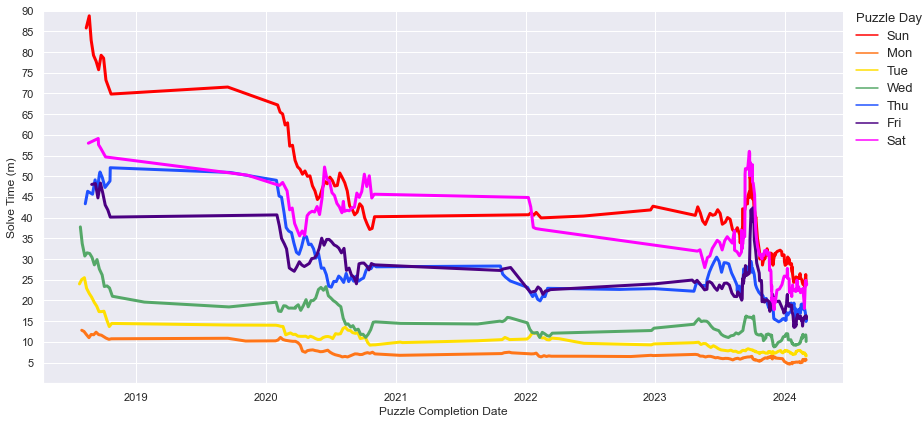

In [43]:
# Plot 10-puzzle moving average of IS2 Solve Times by Day of Week
#Figure2

sns.set(font_scale=1)

p = sns.relplot(
    data=df_IS2, marker = "", x="Comp_Date", y="IST(m)_10p_MA", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=6, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3
).set(title="", 
    ylabel="Solve Time (m)",
    xlabel= "Puzzle Completion Date", yticks = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90], ylim=[0,90]
)

# Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.88, .975])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(13)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(13)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(13)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(13)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(13)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(13)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(13)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(13)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

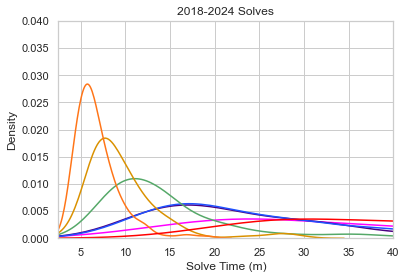

In [44]:
# Density Plot for Entire Sample Time Range (2018-2024)
# (Figure 2 of Modeling Summary -not in EDA Summary)

df_IS2['plot_seq_map'] = df_IS2['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})

sns.set(style="whitegrid")
ax = sns.kdeplot(data=df_IS2, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .04)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2018-2024 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

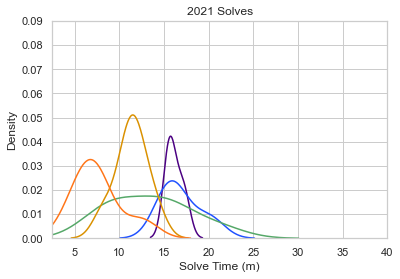

In [45]:
# Density Plot for 2021 Only 
# Figure 2
df1_2021 = df_IS2.loc[(df_IS2["Comp_Yr"] == "2021")]

df1_2021['plot_seq_map'] = df1_2021['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2021, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2021 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

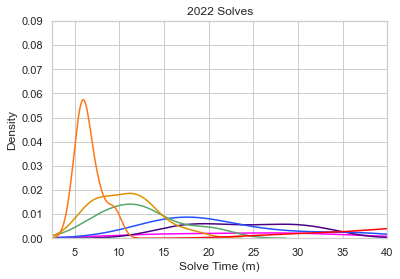

In [46]:
# Density Plot for 2022 Only 
# Figure 2
df1_2022 = df_IS2.loc[(df_IS2["Comp_Yr"] == "2022")]

df1_2022['plot_seq_map'] = df1_2022['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2022, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2022 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

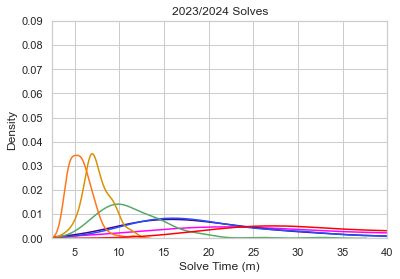

In [47]:
# Density Plot for 2023-2024 Only 
# Figure 2
df1_2023 = df_IS2.loc[(df_IS2["Comp_Yr"] == "2023") | (df_IS2["Comp_Yr"] == "2024")]

df1_2023['plot_seq_map'] = df1_2023['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df1_2023, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 40)
plt.ylim(0, .09)
plt.xticks([5,10,15,20,25,30,35,40])
plt.title('2023/2024 Solves')
ax.set_xlabel("Solve Time (m)")
plt.show()

In [48]:
#For obtaining final moving average values per day for Git summary
df_IS2 = df_IS2.sort_values(by=['Comp_Date'], ascending = False)
df_IS2[['DOW','IST(m)_10p_MA']].head(35)

,DOW,IST(m)_10p_MA
0,Saturday,24.003333
1,Thursday,15.361667
2,Friday,15.618333
3,Saturday,23.643333
4,Friday,16.326667
5,Thursday,15.191667
6,Wednesday,10.096667
7,Tuesday,6.588333
8,Monday,5.670000
9,Sunday,24.366667


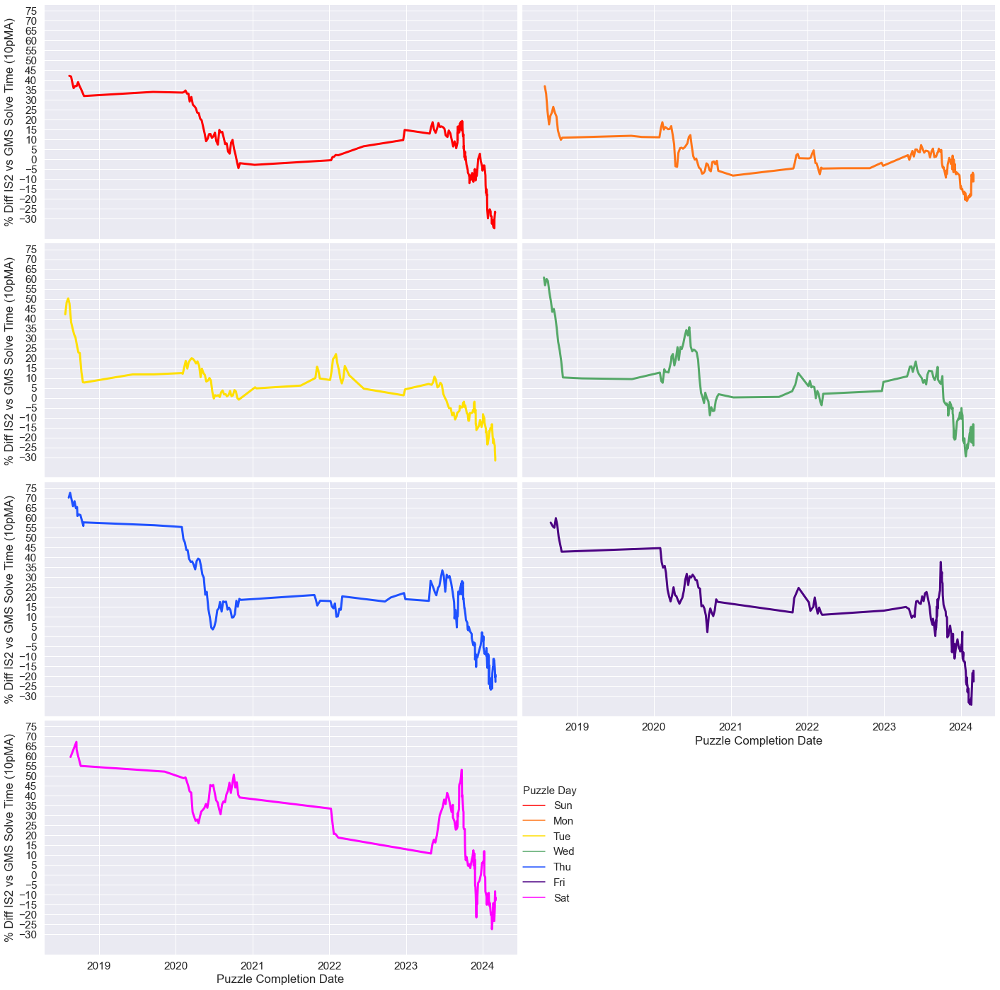

In [49]:
# Plot 10-puzzle moving average of % Difference in Individual Solve Times From Global Median Solve Times
# This normalizes for puzzle difficulty
# Supplmentary Figure 1 (Fig. S1)

sns.set(font_scale=1.4)
#sns.set(rc={'axes.facecolor':'gray',"axes.grid":True,'xtick.labelsize':14,'ytick.labelsize':14})

p = sns.relplot(
    data=df_IS2, marker = "", x="Comp_Date", y="10pMA_of_IST_Diff%_from_GMST", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=5, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3, col="DOW", col_wrap=2, col_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"]
).set(title="", ylabel="% Diff IS2 vs GMS Solve Time (10pMA)",
    xlabel= "Puzzle Completion Date", yticks = [-30, -25, -20, -15, -10, -5, 0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75]
)

plt.subplots_adjust(wspace = 0.01) #decrease whitespace btwn subplot colums
plt.subplots_adjust(hspace = 0.02) #decrease whitespace btwn subplot rows

# # # Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.46, .21])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(15)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(15)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(15)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(15)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(15)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(15)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(15)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(15)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

#title="10-Puzzle Moving Average of % Difference in Solve Times From Global Median Solve Times (Solver 1)", 

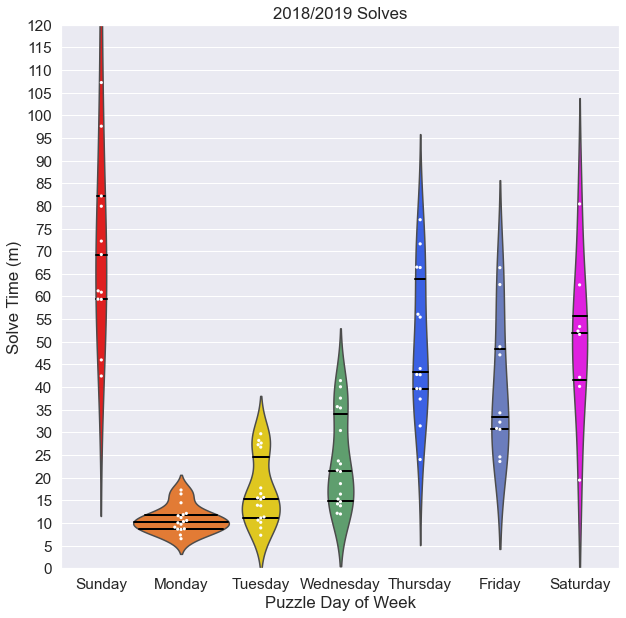

In [50]:
# Violin plots with swarm plot overlay by puzzle day 2018-2019 solves only

IS2_pre2020 = df_IS2.loc[df_IS2["Comp_Date_str"].str.contains("2018") | df_IS2["Comp_Date_str"].str.contains("2019")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS2_pre2020 , size=3.2 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS2_pre2020['DOW'], IS2_pre2020['IST(m)'], width = 1.2, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 107.5)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2018/2019 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [51]:
# Calculate Median and IQR per puzzle day, for 2018/2019 solves
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS2_pre2020.loc[(IS2_pre2020["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count     13.0
mean      74.8
std       25.9
min       42.4
25%       59.4
50%       69.3
75%       82.2
max      135.0
Name: IST(m), dtype: float64
count    17.0
mean     10.9
std       3.0
min       6.5
25%       8.7
50%      10.3
75%      11.8
max      17.3
Name: IST(m), dtype: float64
count    18.0
mean     17.1
std       7.4
min       7.3
25%      11.2
50%      15.4
75%      24.5
max      29.7
Name: IST(m), dtype: float64
count    18.0
mean     23.8
std      10.3
min      12.0
25%      14.9
50%      21.5
75%      34.2
max      41.4
Name: IST(m), dtype: float64
count    14.0
mean     49.6
std      16.0
min      24.0
25%      39.6
50%      43.4
75%      63.8
max      77.0
Name: IST(m), dtype: float64
count    10.0
mean     40.1
std      15.3
min      23.6
25%      30.7
50%      33.3
75%      48.5
max      66.4
Name: IST(m), dtype: float64
count     8.0
mean     50.3
std      17.7
min      19.5
25%      41.7
50%      52.0
75%      55.7
max      80.4
Name: IST(m), dtype: float64


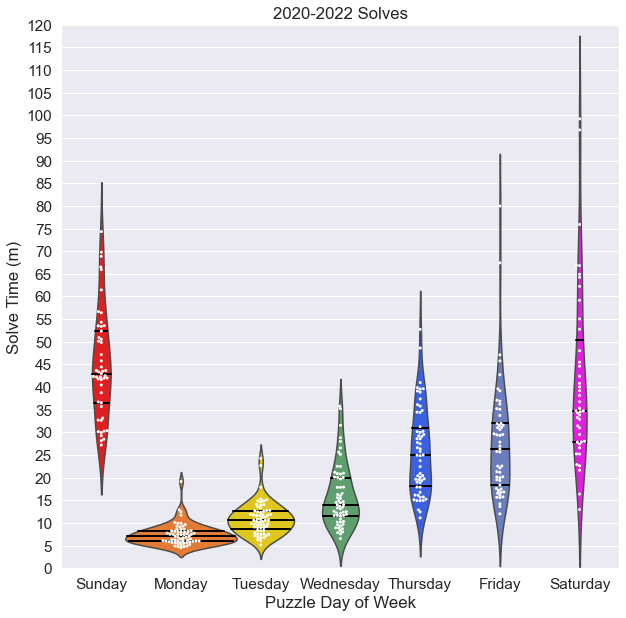

In [52]:
# Violin plots with swarm plot overlay by puzzle day 2020-2022 solves only

IS2_2022 = df_IS2.loc[df_IS2["Comp_Date_str"].str.contains("2020") | df_IS2["Comp_Date_str"].str.contains("2021") | df_IS2["Comp_Date_str"].str.contains("2022")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS2_2022 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS2_2022['DOW'], IS2_2022['IST(m)'], width = 1.4, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 120)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2020-2022 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [53]:
# Calculate Median and IQR per puzzle day, for 2020-2022 solves
print(IS2_2022.loc[(IS2_2022["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS2_2022.loc[(IS2_2022["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    49.0
mean     44.9
std      11.9
min      27.2
25%      36.6
50%      43.0
75%      52.4
max      74.3
Name: IST(m), dtype: float64
count    62.0
mean      7.5
std       2.4
min       4.6
25%       5.9
50%       7.1
75%       8.2
max      19.2
Name: IST(m), dtype: float64
count    63.0
mean     11.0
std       3.5
min       5.2
25%       8.7
50%      10.6
75%      12.6
max      24.3
Name: IST(m), dtype: float64
count    61.0
mean     16.0
std       6.8
min       6.6
25%      11.5
50%      14.0
75%      20.0
max      35.8
Name: IST(m), dtype: float64
count    58.0
mean     25.9
std       9.6
min      11.1
25%      18.2
50%      25.0
75%      31.0
max      52.8
Name: IST(m), dtype: float64
count    53.0
mean     27.9
std      12.8
min      12.0
25%      18.4
50%      26.3
75%      32.0
max      80.0
Name: IST(m), dtype: float64
count    43.0
mean     41.6
std      19.5
min      13.0
25%      28.0
50%      34.8
75%      50.4
max      99.2
Name: IST(m), dtype: float64


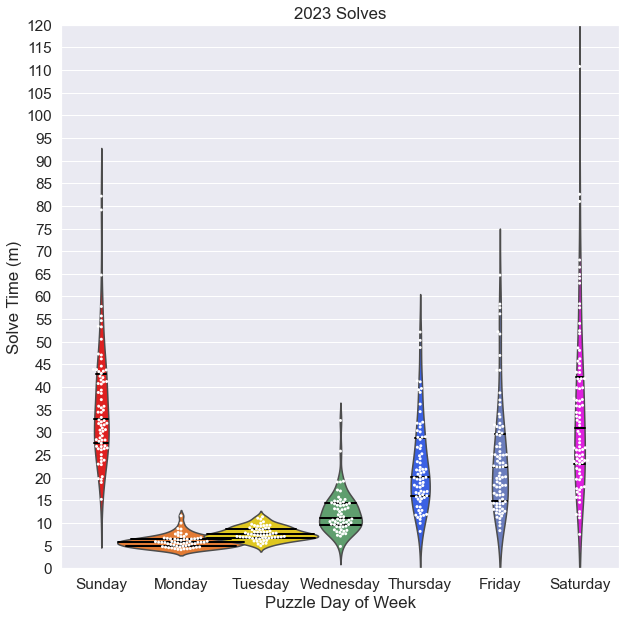

In [54]:
# Violin plots with swarm plot overlay by puzzle day -2023 only
sns.set(font_scale=1.4)

IS2_2023 = df_IS2.loc[df_IS2["Comp_Date_str"].str.contains("2023")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS2_2023 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS2_2023['DOW'], IS2_2023['IST(m)'], width = 1.6, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 120)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2023 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [55]:
# Calculate Median and IQR per puzzle day, for 2023
print(IS2_2023.loc[(IS2_2023["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS2_2023.loc[(IS2_2023["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    74.0
mean     36.3
std      12.6
min      15.2
25%      27.7
50%      33.0
75%      42.9
max      82.2
Name: IST(m), dtype: float64
count    61.0
mean      6.0
std       1.4
min       4.1
25%       4.9
50%       5.7
75%       6.5
max      11.6
Name: IST(m), dtype: float64
count    61.0
mean      7.7
std       1.5
min       5.0
25%       6.8
50%       7.5
75%       8.7
max      11.4
Name: IST(m), dtype: float64
count    62.0
mean     12.3
std       4.5
min       4.8
25%       9.7
50%      11.1
75%      14.3
max      32.6
Name: IST(m), dtype: float64
count    74.0
mean     22.8
std       9.9
min       8.2
25%      15.9
50%      20.2
75%      28.8
max      52.2
Name: IST(m), dtype: float64
count    83.0
mean     24.3
std      12.4
min       8.3
25%      14.8
50%      22.3
75%      29.7
max      64.7
Name: IST(m), dtype: float64
count     84.0
mean      34.6
std       18.1
min        7.5
25%       23.1
50%       30.9
75%       42.2
max      110.8
Name: IST(m), dtype: float64


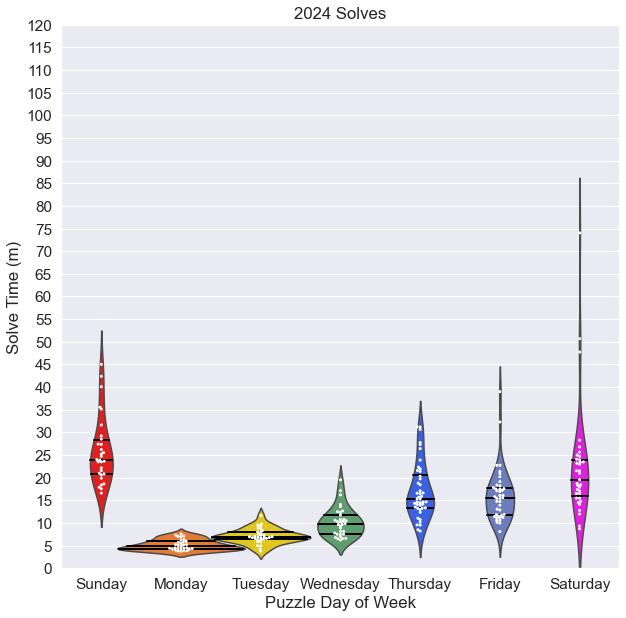

In [56]:
# Violin plots with swarm plot overlay by puzzle day -2024 only
sns.set(font_scale=1.4)

IS2_2024 = df_IS2.loc[df_IS2["Comp_Date_str"].str.contains("2024")]

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=IS2_2024 , size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(IS2_2024['DOW'], IS2_2024['IST(m)'], width = 1.6, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 120)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2024 Solves")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [57]:
# Calculate Median and IQR per puzzle day, for 2024
print(IS2_2024.loc[(IS2_2024["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(IS2_2024.loc[(IS2_2024["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    30.0
mean     25.9
std       7.4
min      16.6
25%      20.9
50%      23.9
75%      28.2
max      45.0
Name: IST(m), dtype: float64
count    30.0
mean      5.2
std       1.2
min       3.8
25%       4.2
50%       4.9
75%       5.9
max       7.6
Name: IST(m), dtype: float64
count    31.0
mean      7.1
std       1.7
min       3.8
25%       6.4
50%       6.9
75%       8.0
max      11.6
Name: IST(m), dtype: float64
count    33.0
mean     10.2
std       3.2
min       6.2
25%       7.6
50%       9.9
75%      11.8
max      19.5
Name: IST(m), dtype: float64
count    44.0
mean     17.1
std       6.1
min       8.2
25%      13.3
50%      15.3
75%      20.6
max      31.2
Name: IST(m), dtype: float64
count    41.0
mean     16.1
std       5.9
min       8.1
25%      11.7
50%      15.6
75%      17.8
max      39.0
Name: IST(m), dtype: float64
count    35.0
mean     22.4
std      12.4
min       8.7
25%      16.0
50%      19.6
75%      24.0
max      74.0
Name: IST(m), dtype: float64


###  Partition of 2023-2024 Data Only

In [58]:
df_recent = df_IS2.loc[(df_IS2["Comp_Date"] >='04/01/2023')]

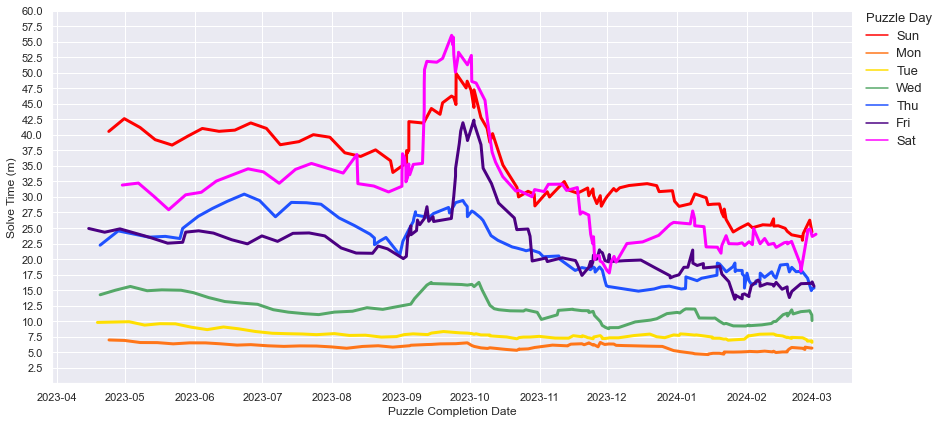

In [59]:
# Plot 10-puzzle moving average of IS2 Solve Times by Day of Week

sns.set(font_scale=1)

p = sns.relplot(
    data=df_recent, marker = "", x="Comp_Date", y="IST(m)_10p_MA", hue="DOW", hue_order=["Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], height=6, aspect=2, palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "indigo", "fuchsia"],
    kind="line", linewidth=3
).set(title="", 
    ylabel="Solve Time (m)",
    xlabel= "Puzzle Completion Date", yticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50, 52.5, 55, 57.5, 60], ylim=[0,60]
)

# Modify legend
leg = p._legend
leg.set_title("Puzzle Day")
leg.set_bbox_to_anchor([.89, .975])  # coordinates of lower left of bounding box
leg.get_title().set_fontsize(13)
leg._loc = 2  # if required you can set the loc
leg.get_texts()[0].set_fontsize(13)
leg.get_texts()[0].set_text('Sun')
leg.get_texts()[1].set_fontsize(13)
leg.get_texts()[1].set_text('Mon')
leg.get_texts()[2].set_fontsize(13)
leg.get_texts()[2].set_text('Tue')
leg.get_texts()[3].set_fontsize(13)
leg.get_texts()[3].set_text('Wed')
leg.get_texts()[4].set_fontsize(13)
leg.get_texts()[4].set_text('Thu')
leg.get_texts()[5].set_fontsize(13)
leg.get_texts()[5].set_text('Fri')
leg.get_texts()[6].set_fontsize(13)
leg.get_texts()[6].set_text('Sat')
leg._legend_box.align = "left"  # or left, or center

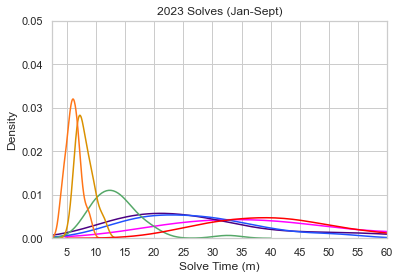

In [60]:
# Density Plot for 01/01/2023-09/30/2023 only 
df2_2023_2024_1 = df_recent.loc[(df_recent["Comp_Date"] <'10/01/2023')]

df2_2023_2024_1['plot_seq_map'] = df2_2023_2024_1['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df2_2023_2024_1, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 60)
plt.ylim(0, .05)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2023 Solves (Jan-Sept)')
ax.set_xlabel("Solve Time (m)")
plt.show()

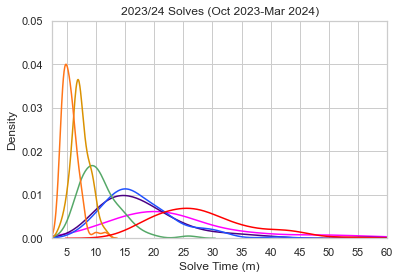

In [61]:
# Density Plot for 10/01/2023-03/01/2024 only 
df2_2023_2024_2 = df_recent.loc[(df_recent["Comp_Date"] >='10/01/2023')]

df2_2023_2024_2['plot_seq_map'] = df2_2023_2024_2['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
sns.set(style="whitegrid")
ax = sns.kdeplot(data=df2_2023_2024_2, x = "IST(m)", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], hue_order=["Sun", "Mon", "Tue","Wed", "Thu", "Fri", "Sat"], legend=False)

#sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(2.5, 60)
plt.ylim(0, .05)
plt.xticks([5,10,15,20,25,30,35,40,45,50,55,60])
plt.title('2023/24 Solves (Oct 2023-Mar 2024)')
ax.set_xlabel("Solve Time (m)")
plt.show()

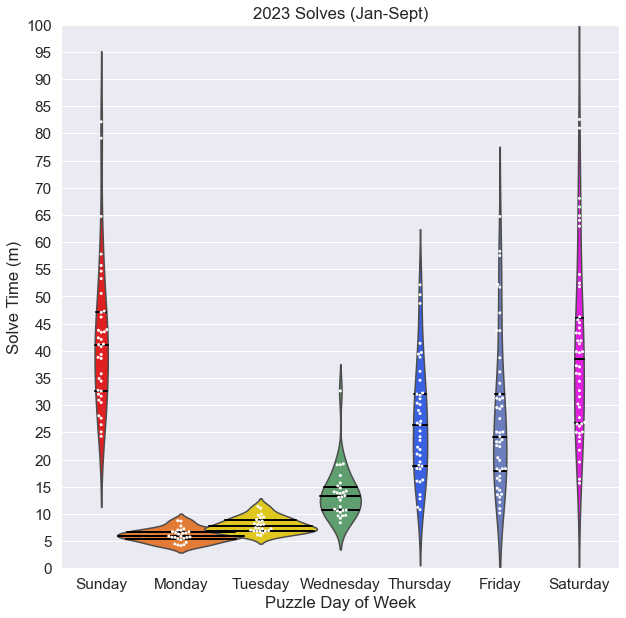

In [62]:
# Violin plots with swarm plot overlay by puzzle day -2023 first interval only
sns.set(font_scale=1.4)

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=df2_2023_2024_1, size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(df2_2023_2024_1['DOW'], df2_2023_2024_1['IST(m)'], width = 1.6, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 100)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2023 Solves (Jan-Sept)")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

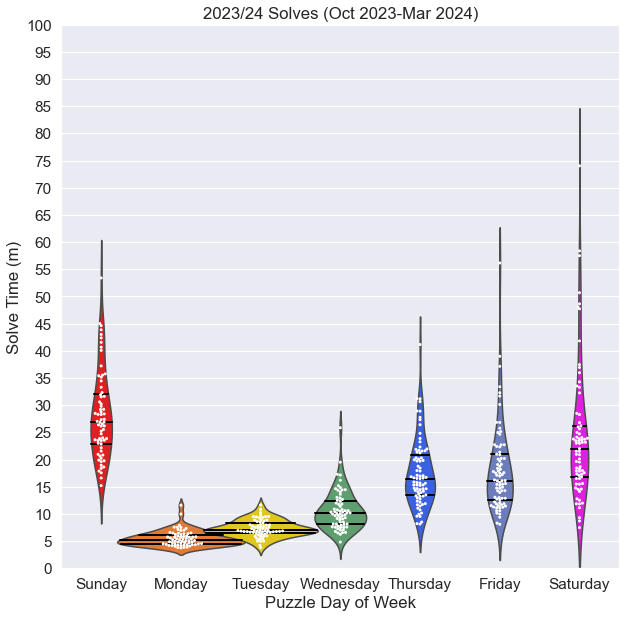

In [63]:
# Violin plots with swarm plot overlay by puzzle day -2023-2024 second interval only
sns.set(font_scale=1.4)

plt.figure(figsize=(10,10))
sns.swarmplot(x="DOW" , y = "IST(m)",data=df2_2023_2024_2, size=3.0 , order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], color="White")
ax = sns.violinplot(df2_2023_2024_2['DOW'], df2_2023_2024_2['IST(m)'], width = 1.6, inner = "quartile", order = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"], palette = ["red", "#FF7518", "#ffdf00", "g", "#1F51FF", "#5d76cb", "fuchsia"])
plt.ylim(0, 100)
plt.yticks([0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100])
ax.set_xlabel("Puzzle Day of Week")
ax.set_ylabel("Solve Time (m)")
ax.set_title("2023/24 Solves (Oct 2023-Mar 2024)")

for l in ax.lines:
    l.set_linestyle('-')
    l.set_linewidth(2)
    l.set_color('black')
    l.set_alpha(1)
plt.show()

In [64]:
# Calculate Median and IQR per puzzle day, for 2023/2024 first interval
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_1.loc[(df2_2023_2024_1["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    37.0
mean     42.3
std      13.4
min      24.3
25%      32.6
50%      41.2
75%      47.1
max      82.2
Name: IST(m), dtype: float64
count    26.0
mean      6.1
std       1.2
min       4.2
25%       5.5
50%       5.9
75%       6.7
max       8.8
Name: IST(m), dtype: float64
count    26.0
mean      8.0
std       1.4
min       6.0
25%       6.9
50%       7.7
75%       8.9
max      11.4
Name: IST(m), dtype: float64
count    28.0
mean     13.8
std       4.8
min       8.4
25%      10.6
50%      13.2
75%      14.9
max      32.6
Name: IST(m), dtype: float64
count    39.0
mean     27.1
std      10.7
min      10.8
25%      18.9
50%      26.4
75%      32.1
max      52.2
Name: IST(m), dtype: float64
count    45.0
mean     27.8
std      13.8
min      10.2
25%      18.0
50%      24.2
75%      32.0
max      64.7
Name: IST(m), dtype: float64
count     46.0
mean      41.4
std       19.2
min       15.6
25%       26.7
50%       38.5
75%       46.1
max      110.8
Name: IST(m), dtype: float64


In [65]:
# Calculate Median and IQR per puzzle day, for 2023/2024 second interval
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Sunday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Monday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Tuesday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Wednesday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Thursday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Friday"), "IST(m)"].describe().round(1))
print(df2_2023_2024_2.loc[(df2_2023_2024_2["DOW"] == "Saturday"), "IST(m)"].describe().round(1))

count    67.0
mean     28.3
std       8.1
min      15.2
25%      22.9
50%      26.9
75%      32.1
max      53.4
Name: IST(m), dtype: float64
count    65.0
mean      5.5
std       1.4
min       3.8
25%       4.5
50%       5.2
75%       6.2
max      11.6
Name: IST(m), dtype: float64
count    66.0
mean      7.3
std       1.6
min       3.8
25%       6.6
50%       7.0
75%       8.2
max      11.6
Name: IST(m), dtype: float64
count    67.0
mean     10.7
std       3.6
min       4.8
25%       8.1
50%      10.1
75%      12.4
max      25.9
Name: IST(m), dtype: float64
count    79.0
mean     17.6
std       6.2
min       8.2
25%      13.4
50%      16.5
75%      20.8
max      41.2
Name: IST(m), dtype: float64
count    79.0
mean     18.1
std       7.9
min       8.1
25%      12.6
50%      16.2
75%      21.0
max      56.2
Name: IST(m), dtype: float64
count    73.0
mean     24.5
std      12.5
min       7.5
25%      16.8
50%      22.0
75%      26.2
max      74.0
Name: IST(m), dtype: float64


In [66]:
# Number of solves in each sub-interval in figure 4
print(len(df2_2023_2024_1))
print(len(df2_2023_2024_2))

247
496


## IS2 Performance vs Global Median Solver

In [205]:
# Create new df with all rows copied and placed below current rows. 
# This is so we can plot all data together as its own subplot 

df_IS2_copy = df_IS2.copy()
df_IS2_copy["DOW"] = "All"

df_IS2_v2 = pd.concat([df_IS2, df_IS2_copy],ignore_index=True)

In [206]:
# Construct numerical categories in desired plotting sequence for combinations of puzzle day and pre-2023 or 2023+
# This is a hack to be able to use lmplot with subplot split and get regression lines - need to figure out more elegant solution

# A numerical column for puzzle day that starts with Sunday and ends with Saturday
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "All") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 1 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "All") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 2
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Sunday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 3 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Sunday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 4
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Monday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 5 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Monday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 6
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Tuesday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 7 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Tuesday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 8
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Wednesday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 9 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Wednesday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 10
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Thursday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 11 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Thursday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 12
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Friday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 13
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Friday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 14
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Saturday") & (df_IS2_v2["2023+_solve"] == 0) , "plot_seq"] = 15 
df_IS2_v2.loc[(df_IS2_v2["DOW"] == "Saturday") & (df_IS2_v2["2023+_solve"] == 1) , "plot_seq"] = 16

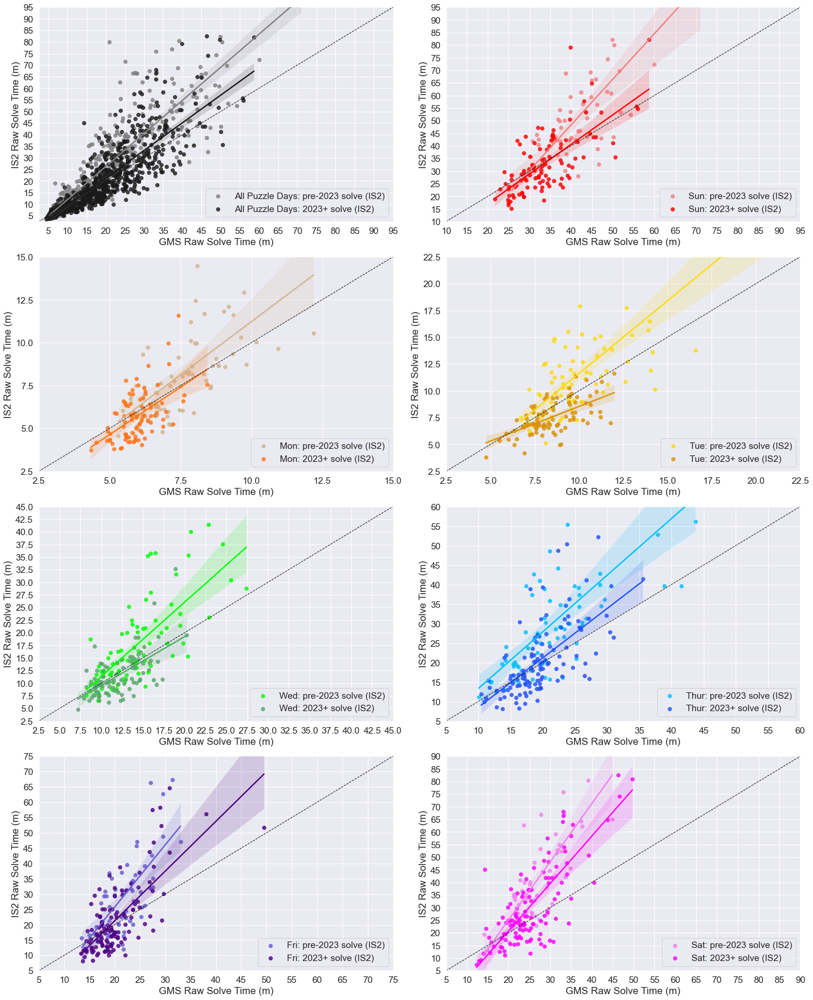

In [207]:
# Scatterplots of individual raw solve times vs global median solve times, per puzzle day
#Figure 5

df_IS2_v2 = df_IS2_v2.sort_values(by=['plot_seq'], ascending = True)

sns.set(font_scale=1.4)

df_IS2_v2['plot_seq_map'] = df_IS2_v2['plot_seq'].map({1: 'All Puzzle Days: pre-2023 solve (IS2)', 2: 'All Puzzle Days: 2023+ solve (IS2)', 3:'Sun: pre-2023 solve (IS2)', 4:'Sun: 2023+ solve (IS2)', 5:'Mon: pre-2023 solve (IS2)', 6:'Mon: 2023+ solve (IS2)', 7:'Tue: pre-2023 solve (IS2)', 8:'Tue: 2023+ solve (IS2)', 9:'Wed: pre-2023 solve (IS2)', 10:'Wed: 2023+ solve (IS2)', 11:'Thur: pre-2023 solve (IS2)', 12:'Thur: 2023+ solve (IS2)', 13:'Fri: pre-2023 solve (IS2)', 14:'Fri: 2023+ solve (IS2)', 15:'Sat: pre-2023 solve (IS2)', 16:'Sat: 2023+ solve (IS2)'})

#sequence = {0:'pre-2023 solve', 1:'2023 solve', 2:'pre-2023 solve', 3:'2023 solve', 4:'pre-2023 solve', 5:'2023 solve', 6:'pre-2023 solve', 7:'2023 solve', 8:'pre-2023 solve', 9:'2023 solve', 10:'pre-2023 solve', 11:'2023 solve', 12:'pre-2023 solve', 13:'2023 solve'}

p = sns.lmplot(
    data=df_IS2_v2, x="GMST(m)", y="IST(m)", hue="plot_seq_map", col="DOW", col_order=["All", "Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], col_wrap=2, palette=["grey", "k", "lightcoral", "red", "tan", "#FF7518", "#FDDA0D", "#da9100", "lime", "g", "deepskyblue", "#1F51FF", "slateblue", "indigo", "violet", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "GMS Raw Solve Time (m)", xticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50, 52.5, 55, 57.5, 60, 62.5, 65, 67.5, 70, 72.5, 75, 77.5, 80, 82.5, 85], yticks = [2.5, 5, 7.5, 10, 12.5, 15, 17.5, 20, 22.5, 25, 27.5, 30, 32.5, 35, 37.5, 40, 42.5, 45, 47.5, 50, 52.5, 55, 57.5, 60, 62.5, 65, 67.5, 70, 72.5, 75, 77.5, 80, 82.5, 85],  
    ylabel="IS2 Raw Solve Time (m)" 
)

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

#Adjust subplots individually
p.axes[0].set_ylim((2.5,95))
p.axes[0].set_xlim((2.5,95))
p.axes[1].set_ylim((12.5,95))
p.axes[1].set_xlim((12.5,95))
p.axes[2].set_ylim((2.5,15))
p.axes[2].set_xlim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[3].set_xlim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[4].set_xlim((2.5,45))
p.axes[5].set_ylim((5,60))
p.axes[5].set_xlim((5,60))
p.axes[6].set_ylim((5,75))
p.axes[6].set_xlim((5,75))
p.axes[7].set_ylim((5,90))
p.axes[7].set_xlim((5,90))

p.axes[0].set_xticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95))
p.axes[0].set_yticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95))
p.axes[1].set_xticks((10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95))
p.axes[1].set_yticks((10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90,95))
p.axes[5].set_xticks((5,10,15,20,25,30,35,40,45,50,55,60))
p.axes[5].set_yticks((5,10,15,20,25,30,35,40,45,50,55,60))
p.axes[6].set_xticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75))
p.axes[6].set_yticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75))
p.axes[7].set_xticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90))
p.axes[7].set_yticks((5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80,85,90))

p.axes[0].plot([2.5, 95], [2.5, 95], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([10, 95], [10, 95], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([2.5, 15], [2.5, 15], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([2.5, 22.5], [2.5, 22.5], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([2.5, 45], [2.5, 45], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([5, 60], [5, 60], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([5, 75], [5, 75], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([5, 90], [5, 90], 'k', linestyle='dashed', linewidth=1)

_= p.axes[0].legend(loc="lower right")
_= p.axes[1].legend(loc="lower right")
_= p.axes[2].legend(loc="lower right")
_= p.axes[3].legend(loc="lower right")
_= p.axes[4].legend(loc="lower right")
_= p.axes[5].legend(loc="lower right")
_= p.axes[6].legend(loc="lower right")
_= p.axes[7].legend(loc="lower right")

In [208]:
# Correlations for pre-2023 for IST vs GMST
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure5

df_IS2_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0)] #pre-2023 solves only
df_All = df_IS2_pre2023.copy() #all puzzle days
df_Sun = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Sunday")]
df_Mon = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Monday")]
df_Tue = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Tuesday")]
df_Wed = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Wednesday")]
df_Thu = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Thursday")]
df_Fri = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Friday")]
df_Sat = df_IS2_pre2023.loc[df_IS2_pre2023["DOW"]==("Saturday")]

print(df_All['IST(m)'].corr(df_All['GMST(m)']))
print(df_Sun['IST(m)'].corr(df_Sun['GMST(m)']))
print(df_Mon['IST(m)'].corr(df_Mon['GMST(m)']))
print(df_Tue['IST(m)'].corr(df_Tue['GMST(m)']))
print(df_Wed['IST(m)'].corr(df_Wed['GMST(m)']))
print(df_Thu['IST(m)'].corr(df_Thu['GMST(m)']))
print(df_Fri['IST(m)'].corr(df_Fri['GMST(m)']))
print(df_Sat['IST(m)'].corr(df_Sat['GMST(m)']))

0.8770678379382575
0.8163405670727236
0.6028254804444714
0.800640319203612
0.7275313134707445
0.6793666331252083
0.600994075832972
0.7812231261969624


In [209]:
# Correlations for 2023_24 for IST vs GMST
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure 5

df_IS2_2023_24 = df_IS2.loc[(df_IS2["2023+_solve"] == 1)] #2023-2024 solves only
df_All = df_IS2_2023_24.copy() #all puzzle days
df_Sun = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Sunday")]
df_Mon = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Monday")]
df_Tue = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Tuesday")]
df_Wed = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Wednesday")]
df_Thu = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Thursday")]
df_Fri = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Friday")]
df_Sat = df_IS2_2023_24.loc[df_IS2_2023_24["DOW"]==("Saturday")]

print(df_All['IST(m)'].corr(df_All['GMST(m)']))
print(df_Sun['IST(m)'].corr(df_Sun['GMST(m)']))
print(df_Mon['IST(m)'].corr(df_Mon['GMST(m)']))
print(df_Tue['IST(m)'].corr(df_Tue['GMST(m)']))
print(df_Wed['IST(m)'].corr(df_Wed['GMST(m)']))
print(df_Thu['IST(m)'].corr(df_Thu['GMST(m)']))
print(df_Fri['IST(m)'].corr(df_Fri['GMST(m)']))
print(df_Sat['IST(m)'].corr(df_Sat['GMST(m)']))

0.8457363995504055
0.7040173579781918
0.5434084644613105
0.607058374636813
0.6151800788106259
0.6505585312029026
0.7343593870379639
0.7782562113704458


In [210]:
# IS2 vs GMS by Puzzle Day: pre-2023 solves
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure 5

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
All_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(All_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Sun_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sun_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Mon_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Mon_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Tue_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Tue_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Wed_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Wed_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Thu_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Thu_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Fri_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Fri_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Sat_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sat_IST_win_pct)


28.74743326488706
24.193548387096776
48.10126582278481
34.5679012345679
29.11392405063291
20.833333333333336
22.22222222222222
13.725490196078432


In [211]:
# Win % for IS2 vs GMS by Puzzle Day: 2023_2024 solves
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure 5

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
All_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(All_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Sun_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sun_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Mon_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Mon_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Tue_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Tue_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Wed_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Wed_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Thu_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Thu_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Fri_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Fri_IST_win_pct)

IST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] < df_IS2["GMST(m)"])])
GMST_wins = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] > df_IS2["GMST(m)"])])
Ties = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST(m)"] == df_IS2["GMST(m)"])])
Sat_IST_win_pct = (IST_wins/(IST_wins + GMST_wins + Ties))*100
print(Sat_IST_win_pct)


57.065948855989234
57.692307692307686
67.03296703296702
75.0
62.10526315789474
51.69491525423729
53.2258064516129
40.33613445378151


In [212]:
# Mean difference for raw IST vs GMST pre2023 
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure 5

df_IS2['IST_raw_Diff_GMST'] = (df_IS2['IST(m)'] - df_IS2['GMST(m)'])

print(df_IS2.loc[(df_IS2["2023+_solve"] == 0), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))

           mean
            std
mean   6.069336
std   10.519281
           mean
            std
mean   9.600806
std   13.559060
          mean
           std
mean  0.635021
std   2.303007
          mean
           std
mean  1.806173
std   3.354279
          mean
           std
mean  3.386709
std   6.057106
           mean
            std
mean   8.666435
std   11.076803
           mean
            std
mean   7.851323
std   11.811047
           mean
            std
mean  15.252614
std   14.760928


In [213]:
# Mean difference for raw IST vs GMST 2023_2024 
# Careful not to use _v2, since that version has duplicated data for plotting only
#Figure 5

print(df_IS2.loc[(df_IS2["2023+_solve"] == 1), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))
print(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday"), "IST_raw_Diff_GMST"].agg([('mean', 'std')]))

          mean
           std
mean  1.014581
std   7.874063
          mean
           std
mean -0.487179
std   8.778784
          mean
           std
mean -0.261905
std   1.169091
          mean
           std
mean -0.905616
std   1.331031
          mean
           std
mean -0.508421
std   3.303966
          mean
           std
mean  1.066384
std   7.016463
          mean
           std
mean  1.397715
std   8.349305
           mean
            std
mean   5.552941
std   12.692593


In [214]:
#df_IS1 = df_IS1.drop(["IST_raw_Diff_GMST"], axis=1, inplace=True)

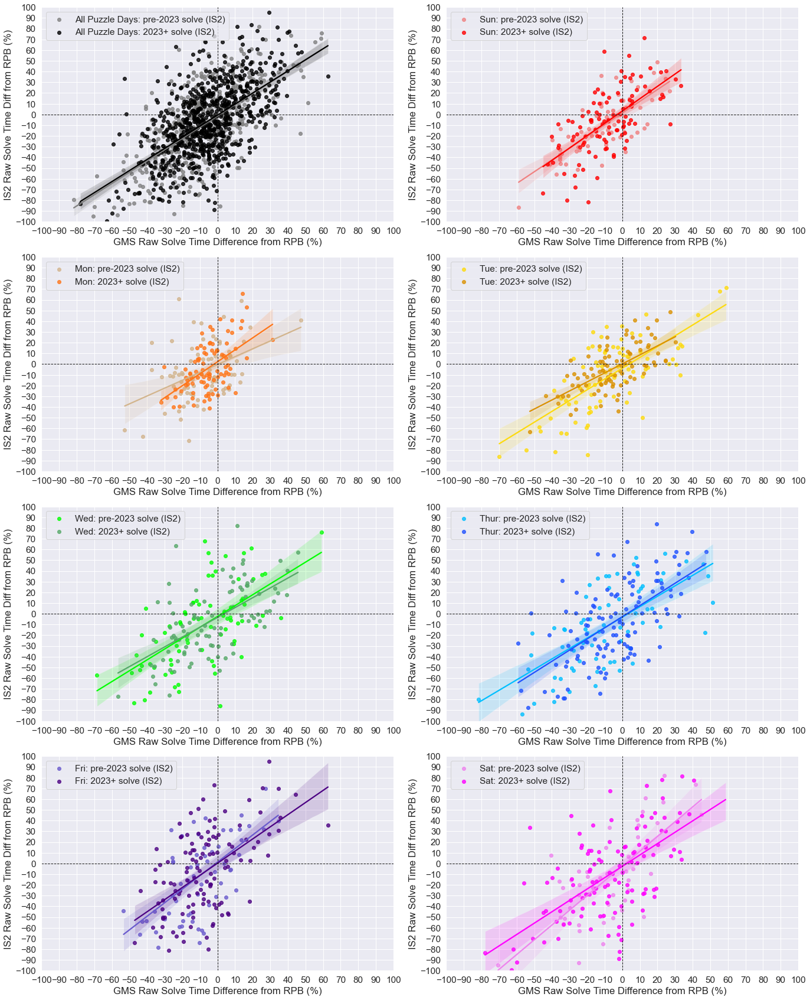

In [215]:
# Scatterplots of difference from NON-time-decay weighted previous 10-puzzle average for individual solver for a given solve vs same for global median solver, per puzzle day
# This isolates RELATIVE performance for the individual solver on a given puzzle vs their recent performance, and how that relative performance compares to that for the median solver
#Figure 6

df_IS2_v2 = df_IS2_v2.sort_values(by=['plot_seq'], ascending = True)

sns.set(font_scale=1.4)

df_IS2_v2['plot_seq_map'] = df_IS2_v2['plot_seq'].map({1: 'All Puzzle Days: pre-2023 solve (IS2)', 2: 'All Puzzle Days: 2023+ solve (IS2)', 3:'Sun: pre-2023 solve (IS2)', 4:'Sun: 2023+ solve (IS2)', 5:'Mon: pre-2023 solve (IS2)', 6:'Mon: 2023+ solve (IS2)', 7:'Tue: pre-2023 solve (IS2)', 8:'Tue: 2023+ solve (IS2)', 9:'Wed: pre-2023 solve (IS2)', 10:'Wed: 2023+ solve (IS2)', 11:'Thur: pre-2023 solve (IS2)', 12:'Thur: 2023+ solve (IS2)', 13:'Fri: pre-2023 solve (IS2)', 14:'Fri: 2023+ solve (IS2)', 15:'Sat: pre-2023 solve (IS2)', 16:'Sat: 2023+ solve (IS2)'})

#sequence = {0:'pre-2023 solve', 1:'2023 solve', 2:'pre-2023 solve', 3:'2023 solve', 4:'pre-2023 solve', 5:'2023 solve', 6:'pre-2023 solve', 7:'2023 solve', 8:'pre-2023 solve', 9:'2023 solve', 10:'pre-2023 solve', 11:'2023 solve', 12:'pre-2023 solve', 13:'2023 solve'}

p = sns.lmplot(
    data=df_IS2_v2, x="GMST_Diff%_from_GMS_pds_l40_dw", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW", col_order=["All", "Sunday", "Monday", "Tuesday","Wednesday", "Thursday", "Friday", "Saturday"], col_wrap=2, palette=["grey","black","lightcoral", "red", "tan", "#FF7518", "#FDDA0D", "#da9100", "lime", "g", "deepskyblue", "#1F51FF", "slateblue", "indigo", "violet", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "GMS Raw Solve Time Difference from RPB (%)",
    ylabel="IS2 Raw Solve Time Diff from RPB (%)", xticks = [-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100], yticks = [-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100]  
)

#Adjust subplots individually
p.axes[0].set_ylim((-100,100))
p.axes[0].set_xlim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[1].set_xlim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[2].set_xlim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[3].set_xlim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[4].set_xlim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[5].set_xlim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[6].set_xlim((-100,100))
p.axes[7].set_ylim((-100,100))
p.axes[7].set_xlim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

p.axes[0].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[0].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[1].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[2].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[3].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[4].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[5].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[6].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([0, 0], [-100, 100], 'k', linestyle='dashed', linewidth=1)
p.axes[7].plot([-100, 100], [0, 0], 'k', linestyle='dashed', linewidth=1)

_= p.axes[0].legend(loc = 'upper left')
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [216]:
df_IS2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 472 to 779
Data columns (total 53 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1230 non-null   datetime64[ns]
 1   P_Date_str                             1230 non-null   object        
 2   P_Yr                                   1230 non-null   period[A-DEC] 
 3   2023+_puzzle                           1230 non-null   float64       
 4   DOW                                    1230 non-null   object        
 5   DOW_num                                1230 non-null   float64       
 6   GMST(m)                                1230 non-null   float64       
 7   GMST(m)_10p_MA                         1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1230 non-null   int64         
 9   GMS_pds_l40_dw                         1230 non-null   float64

In [217]:
#Quadrant Analysis pre-2023 (note: very very rare exact zero difference puzzles are ignored for this calculation)
# Careful not to use _v2, since that version has duplicated data for plotting only

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

50.83333333333333 19.583333333333332 17.083333333333332 12.5
55.73770491803278 18.0327868852459 16.39344262295082 9.836065573770492
51.28205128205128 16.666666666666664 20.51282051282051 11.538461538461538
46.25 21.25 18.75 13.750000000000002
46.15384615384615 16.666666666666664 17.94871794871795 19.230769230769234
53.52112676056338 23.943661971830984 14.084507042253522 8.450704225352112
50.0 17.741935483870968 22.58064516129032 9.67741935483871
56.00000000000001 24.0 6.0 14.000000000000002


In [218]:
#Quadrant Analysis 2023+ (note: very very rare exact zero difference puzzles are ignored for this calculation)

# Careful not to use _v2, since that version has duplicated data for plotting only

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

Upper_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Lower_Left = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] < 0)])
Upper_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] > 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
Lower_Right = len(df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday") & (df_IS2["IST_Diff%_from_IS_pds_l10_dw"] < 0) & (df_IS2["GMST_Diff%_from_GMS_pds_l40_dw"] > 0)])
                 
Upper_Left_pct = (Upper_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Left_pct = (Lower_Left/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Upper_Right_pct = (Upper_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
Lower_Right_pct = (Lower_Right/(Upper_Left + Lower_Left + Upper_Right + Lower_Right))*100
print(Lower_Left_pct, Upper_Right_pct, Upper_Left_pct, Lower_Right_pct)

47.7792732166891 24.49528936742934 16.55450874831763 11.17092866756393
50.96153846153846 23.076923076923077 15.384615384615385 10.576923076923077
49.45054945054945 16.483516483516482 21.978021978021978 12.087912087912088
52.17391304347826 25.0 13.043478260869565 9.782608695652174
45.26315789473684 29.47368421052631 9.473684210526317 15.789473684210526
42.3728813559322 29.66101694915254 13.559322033898304 14.40677966101695
48.38709677419355 18.548387096774192 26.61290322580645 6.451612903225806
47.05882352941176 28.57142857142857 14.285714285714285 10.084033613445378


In [219]:
# Correlation analysis pre-2023
# Careful not to use _v2, since that version has duplicated data for plotting only

All_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"]==0)]
print(All_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(All_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Sun_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Sunday")]
print(Sun_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sun_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Mon_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Monday")]
print(Mon_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Mon_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Tue_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Tuesday")]
print(Tue_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Tue_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Wed_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Wednesday")]
print(Wed_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Wed_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Thu_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Thursday")]
print(Thu_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Thu_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Fri_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Friday")]
print(Fri_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Fri_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

Sat_pre2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 0) & (df_IS2["DOW"] == "Saturday")]
print(Sat_pre2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sat_pre2023['IST_Diff%_from_IS_pds_l10_dw']))

0.6360297414506109
0.7453359582966446
0.43199545040277
0.7078529946526875
0.6119470732697119
0.6630690682091087
0.5733630302557086
0.7218145023637287


In [220]:
# Correlation analysis 2023+
# Careful not to use _v2, since that version has duplicated data for plotting only

All_2023 = df_IS2.loc[(df_IS2["2023+_solve"]==1)]
print(All_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(All_2023['IST_Diff%_from_IS_pds_l10_dw']))

Sun_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Sunday")]
print(Sun_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sun_2023['IST_Diff%_from_IS_pds_l10_dw']))

Mon_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Monday")]
print(Mon_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Mon_2023['IST_Diff%_from_IS_pds_l10_dw']))

Tue_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Tuesday")]
print(Tue_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Tue_2023['IST_Diff%_from_IS_pds_l10_dw']))

Wed_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Wednesday")]
print(Wed_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Wed_2023['IST_Diff%_from_IS_pds_l10_dw']))

Thu_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Thursday")]
print(Thu_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Thu_2023['IST_Diff%_from_IS_pds_l10_dw']))

Fri_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Friday")]
print(Fri_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Fri_2023['IST_Diff%_from_IS_pds_l10_dw']))

Sat_2023 = df_IS2.loc[(df_IS2["2023+_solve"] == 1) & (df_IS2["DOW"] == "Saturday")]
print(Sat_2023['GMST_Diff%_from_GMS_pds_l40_dw'].corr(Sat_2023['IST_Diff%_from_IS_pds_l10_dw']))

0.5963042369359876
0.6479601681884561
0.5440808922361802
0.6669110622333446
0.6087106857786909
0.6273538935673344
0.5357460827901246
0.6096429326714146


### Constructor Analysis
Which constructors does individual solver 2 (IS2) struggle against? Which ones does IS2 do well against? This analysis is with respect to average deviation for solve performance on given puzzle from recent (time-weighted) performance per constructor/constructor team (aligns with what we have available for the global median solver). 

In [225]:
# Get stats for Individual Solver
constructor_avgs_IS = df_IS2.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l10_dw'].agg(constructor_mean_IS=(np.mean), puzzle_count_IS=(np.count_nonzero))
constructor_avgs_IS["constructor_mean_IS"] = constructor_avgs_IS["constructor_mean_IS"].round(2)

#Get stats for Global Mean Solver
constructor_avgs_GMT = df_IS2.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].agg(constructor_mean_GMS=(np.mean), puzzle_count_GMS=(np.count_nonzero))
constructor_avgs_GMT["constructor_mean_GMS"] = constructor_avgs_GMT["constructor_mean_GMS"].round(2)

#Merge Individual and Global Mean stats into single df
constructor_avgs = constructor_avgs_IS.merge(constructor_avgs_GMT, on='Constructors', how='inner')

puzzle_min_threshold = 4 #min number of puzzles in sample for constructor/constructor team to be kept in the analysis 

# Pare down to only constructor(s) with at least n puzzles for which IS2 has completed
constructor_avgs_filter = constructor_avgs.loc[constructor_avgs['puzzle_count_IS'] >= puzzle_min_threshold] 

In [226]:
constructor_avgs_filter.head(35)

,constructor_mean_IS,puzzle_count_IS,constructor_mean_GMS,puzzle_count_GMS
Constructors,,,,
Aaron M. Rosenberg,8.39,4.0,0.81,4.0
Adam Wagner,-6.81,8.0,-0.97,8.0
Adrian Johnson,-30.79,4.0,-3.59,4.0
Aimee Lucido,-20.26,8.0,-17.54,8.0
Alan Arbesfeld,20.60,4.0,8.89,4.0
Alex Eaton-Salners,15.00,19.0,2.13,19.0
Amanda Chung and Karl Ni,-25.96,7.0,-16.48,7.0
Andrew Kingsley,-28.08,4.0,-25.47,4.0
Barbara Lin,-18.85,6.0,-21.40,6.0


In [227]:
constructor_avgs_filter.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87 entries, Aaron M. Rosenberg to Zhouqin Burnikel
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   constructor_mean_IS   87 non-null     float64
 1   puzzle_count_IS       87 non-null     float64
 2   constructor_mean_GMS  87 non-null     float64
 3   puzzle_count_GMS      87 non-null     float64
dtypes: float64(4)
memory usage: 3.4+ KB


In [224]:
constructor_avgs_filter.to_csv('../data/constructor_avgs_filter.csv', index=True)

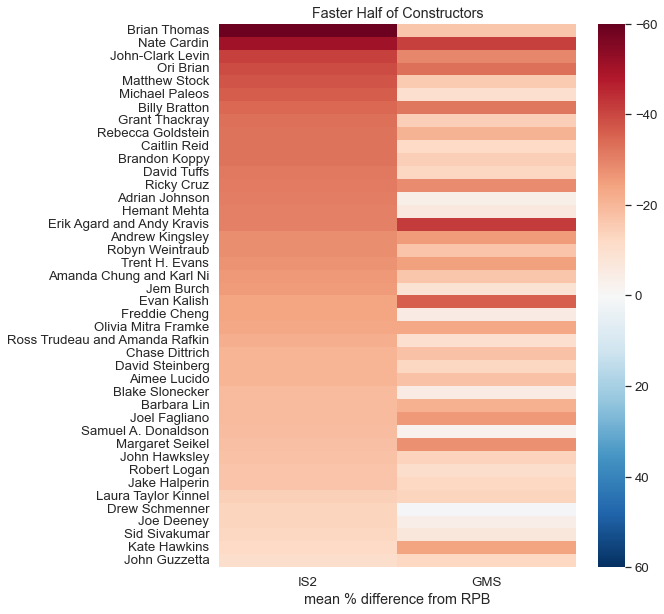

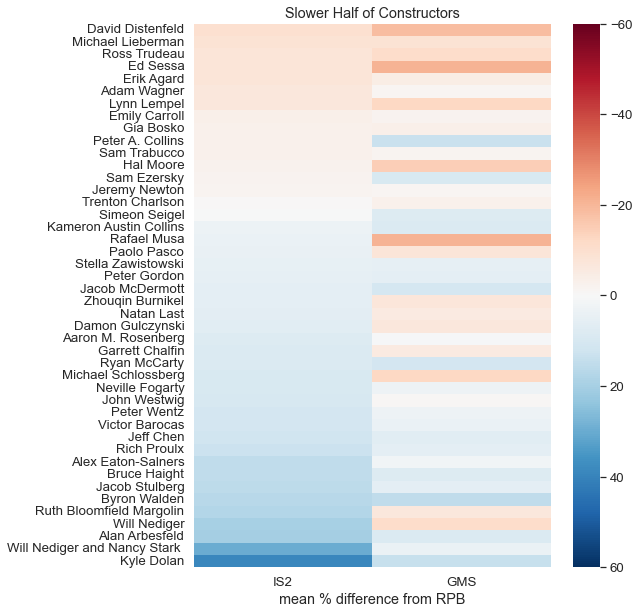

In [228]:
# Construct Heat Map sorted by fastest constructor relative to Individual solver 10 puzzle moving average to slowest

#Remove puzzle ns columns and sort for heatmapping
avgs = constructor_avgs_filter[["constructor_mean_IS", "constructor_mean_GMS"]]
avgs = avgs.sort_values(by=['constructor_mean_IS'], ascending = True)

first_half_end = int((len(avgs)/2)-1)
avgs_end = int(len(avgs))
first_half = avgs[0:first_half_end]
second_half = avgs[(first_half_end+1):avgs_end]

first_half = first_half.sort_values(by=['constructor_mean_IS'], ascending = True)
plt.figure(figsize=(8,10))
sns.set(font_scale=1.2)
ax = sns.heatmap(first_half, xticklabels=['IS2', 'GMS'], cmap="RdBu", vmin=-60, vmax=60, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Faster Half of Constructors")
plt.show()

second_half = second_half.sort_values(by=['constructor_mean_IS'], ascending = True)
plt.figure(figsize=(8,10))
sns.set(font_scale=1.2)
ax2 = sns.heatmap(second_half, xticklabels=['IS2', 'GMS'], cmap="RdBu", vmin=-60, vmax=60, yticklabels=True)
plt.gcf().axes[1].invert_yaxis() #flip color bar to show fastest at the top
plt.xlabel('mean % difference from RPB')
plt.ylabel('')
plt.title("Slower Half of Constructors")
plt.show()

In [229]:
print(constructor_avgs_filter[["constructor_mean_IS"]].agg(['min', 'max']))
print(constructor_avgs_filter[["constructor_mean_GMS"]].agg(['min', 'max']))

     constructor_mean_IS
min               -58.86
max                39.28
     constructor_mean_GMS
min                -42.07
max                 15.15


In [230]:
# Calculate past performance (using COMP date to sort) for IS2 against a given constructor (% difference from RPB) for each puzzle in sample
# Individual Solver mean past performance versus a given constructor(s), per puzzle. 
# This is calculated off of deviation from 20-RPB, so that it can be collapsed across puzzle days
# Getting the count as well will allow filtering by past number of puzzles for a second version of the figure

df_IS2 = df_IS2.sort_values(by=['Constructors','Comp_Date'], ascending = False)

df_IS2 = df_IS2.iloc[::-1]
df_IS2['IS_per_constr_avg_past_diff_from_RPB'] = df_IS2.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l10_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).mean().round(2).shift(1))
df_IS2['IS_per_constr_past_diff_from_RPB_ct'] = df_IS2.groupby(['Constructors'])['IST_Diff%_from_IS_pds_l10_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).count().shift(1))
df_IS2 = df_IS2.iloc[::-1]

# col = df_IS2.pop('GMS_per_constr_avg_past_diff_from_10pMA')
# df_IS2.insert(17, col.name, col)

In [90]:
# Checkpoint
df_IS2.to_csv('../data/df_IS2.csv', index=False)

In [91]:
# Create df that includes only puzzles with Constructor(s) where there are >=3 prior puzzles by them
df_IS2_filter = df_IS2.loc[(df_IS2["IS_per_constr_past_diff_from_RPB_ct"] >= 3)]
df_IS2_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 289 entries, 329 to 451
Data columns (total 51 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   P_Date                                289 non-null    datetime64[ns]
 1   P_Date_str                            289 non-null    object        
 2   P_Yr                                  289 non-null    period[A-DEC] 
 3   2023+_puzzle                          289 non-null    float64       
 4   DOW                                   289 non-null    object        
 5   DOW_num                               289 non-null    float64       
 6   GMST(m)                               289 non-null    float64       
 7   GMST(m)_10p_MA                        289 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA            289 non-null    int64         
 9   GMS_pds_l40_dw                        289 non-null    float64       
 10  

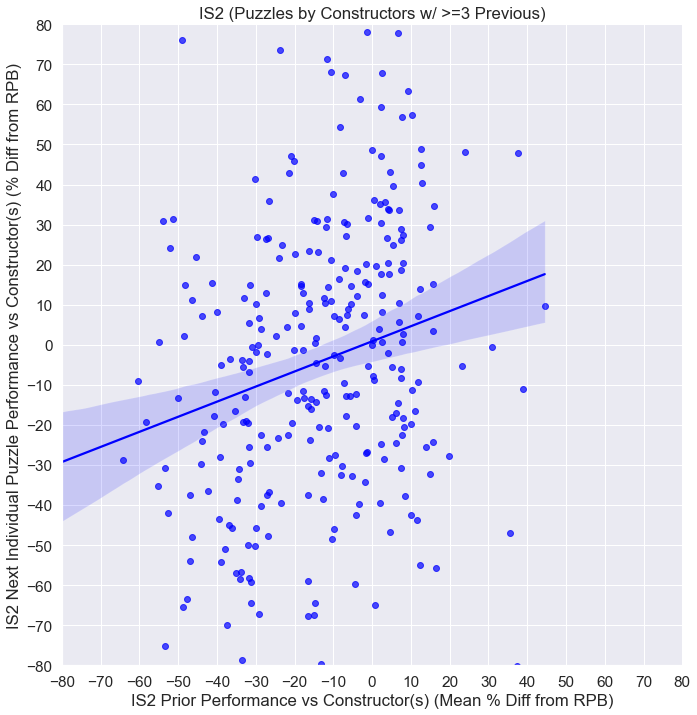

In [235]:
# Idea here is to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that is normalized for both puzzle day difficulty and recent past performance

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_IS2_filter, x="IS_per_constr_avg_past_diff_from_RPB", y="IST_Diff%_from_IS_pds_l10_dw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "blue", "alpha": 0.7}, line_kws = {"color": "blue"}
).set(title="IS2 (Puzzles by Constructors w/ >=3 Previous)", xlabel= "IS2 Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="IS2 Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80], yticks = [-80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80]
)

# #Adjust subplots individually
_= p.set(ylim=(-80, 80))
_= p.set(xlim=(-80, 80))

In [236]:
# Correlation Calculation (Pearson r)
print(df_IS2_filter['IS_per_constr_avg_past_diff_from_RPB'].corr(df_IS2_filter['IST_Diff%_from_IS_pds_l10_dw']))

0.22907737465980418


In [237]:
# Calculate past performance (using PUZZLE ISSUE date to sort) for GMS against a given constructor (% difference from RPB) for each puzzle in sample
# GMS mean past performance versus a given constructor(s), per puzzle. 
# This is calculated off of deviation from NDTW last 10-puzzle moving average, so that it can be collapsed across puzzle days
# Getting the count as well will allow filtering by past number of puzzles for a second version of the figure
#Important reminder that 'GMST_Diff%_from_GMS_pds_l40_dw' was calculated per puzzle BEFORE stripping down to only IS2 solves (and sorting using puzzle issue date)

df_IS2 = df_IS2.sort_values(by=['Constructors','P_Date'], ascending = False)

df_IS2 = df_IS2.iloc[::-1]
df_IS2['GMS_per_constr_avg_past_diff_from_RPB'] = df_IS2.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).mean().round(2).shift(1))
df_IS2['GMS_per_constr_past_diff_from_RPB_ct'] = df_IS2.groupby(['Constructors'])['GMST_Diff%_from_GMS_pds_l40_dw'].transform(lambda x: x.rolling(window=100, min_periods = 1).count().shift(1))
df_IS2 = df_IS2.iloc[::-1]

# col = df_IS2.pop('GMS_per_constr_avg_past_diff_from_10pMA')
# df_IS2.insert(17, col.name, col)

In [238]:
# Create df that includes only puzzles with Constructor(s) where there are >=3 prior puzzles by them
df_IS2_filter = df_IS2.loc[(df_IS2["GMS_per_constr_past_diff_from_RPB_ct"] >= 3)]
df_IS2_filter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 793 to 660
Data columns (total 53 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 293 non-null    datetime64[ns]
 1   P_Date_str                             293 non-null    object        
 2   P_Yr                                   293 non-null    period[A-DEC] 
 3   2023+_puzzle                           293 non-null    float64       
 4   DOW                                    293 non-null    object        
 5   DOW_num                                293 non-null    float64       
 6   GMST(m)                                293 non-null    float64       
 7   GMST(m)_10p_MA                         293 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             293 non-null    int64         
 9   GMS_pds_l40_dw                         293 non-null    float64 

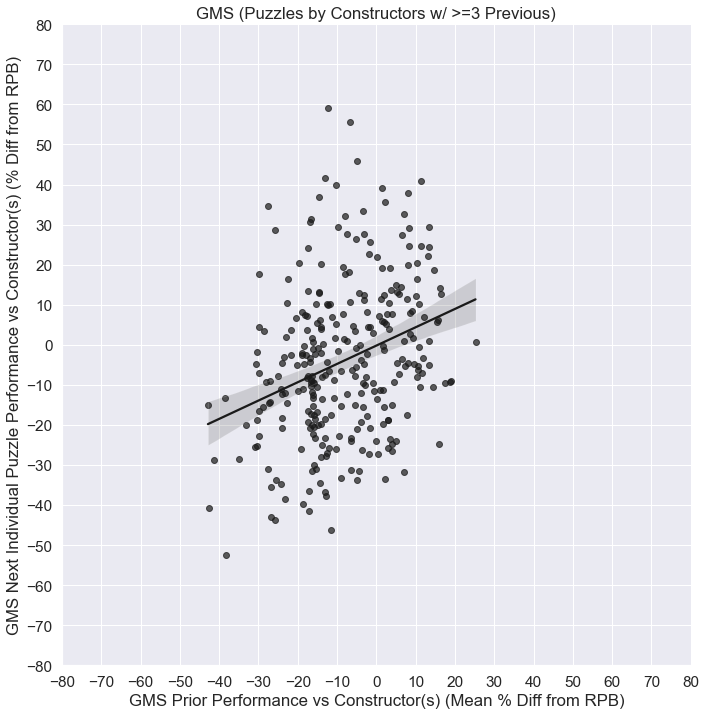

In [241]:
# Idea here is to get correlation between past performance vs a given constructor and performance on a given puzzle, in a way that is normalized for both puzzle day difficulty and recent past performance

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=df_IS2_filter, x="GMS_per_constr_avg_past_diff_from_RPB", y="GMST_Diff%_from_GMS_pds_l40_dw",
    height=10, aspect=1, legend=False, scatter_kws = {"color": "k", "alpha": 0.7}, line_kws = {"color": "k"}
).set(title="GMS (Puzzles by Constructors w/ >=3 Previous)", xlabel= "GMS Prior Performance vs Constructor(s) (Mean % Diff from RPB)",
    ylabel="GMS Next Individual Puzzle Performance vs Constructor(s) (% Diff from RPB)", xticks =[-80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80], yticks = [-80, -70, -60, -50, -40, -30, -20, -10, 0, 10, 20, 30, 40, 50, 60, 70, 80]
)

# #Adjust subplots individually
_= p.set(ylim=(-80, 80))
_= p.set(xlim=(-80, 80))

In [242]:
# Correlation Calculation (Pearson r)
print(df_IS2_filter['GMS_per_constr_avg_past_diff_from_RPB'].corr(df_IS2_filter['GMST_Diff%_from_GMS_pds_l40_dw']))

0.30062557230843817


### Completion Time of Day Analysis

In [243]:
IS2_df2 = df_IS2.copy()

In [244]:
#Creates a column where Individual Solver completion timestamps are binned to the hour in 24-hour cycle
IS2_df2['Comp_Hr'] = IS2_df2['Comp_Date'].dt.hour
IS2_df2['Comp_Hr'].value_counts()
IS2_df2['Comp_Hr']= IS2_df2['Comp_Hr'].astype('int64')
IS2_df2 = IS2_df2.sort_values('Comp_Hr')

In [245]:
IS2_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 279 to 54
Data columns (total 54 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1230 non-null   datetime64[ns]
 1   P_Date_str                             1230 non-null   object        
 2   P_Yr                                   1230 non-null   period[A-DEC] 
 3   2023+_puzzle                           1230 non-null   float64       
 4   DOW                                    1230 non-null   object        
 5   DOW_num                                1230 non-null   float64       
 6   GMST(m)                                1230 non-null   float64       
 7   GMST(m)_10p_MA                         1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1230 non-null   int64         
 9   GMS_pds_l40_dw                         1230 non-null   float64 

In [246]:
col = IS2_df2.pop('Comp_Hr')
IS2_df2.insert(9, col.name, col)

In [247]:
# Construct numerical categories in desired plotting sequence for combinations of puzzle day and pre-2023 or 2023+

IS2_df2.loc[(IS2_df2["DOW"] == "Sunday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 1 
IS2_df2.loc[(IS2_df2["DOW"] == "Sunday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 2
IS2_df2.loc[(IS2_df2["DOW"] == "Monday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 3 
IS2_df2.loc[(IS2_df2["DOW"] == "Monday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 4
IS2_df2.loc[(IS2_df2["DOW"] == "Tuesday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 5 
IS2_df2.loc[(IS2_df2["DOW"] == "Tuesday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 6
IS2_df2.loc[(IS2_df2["DOW"] == "Wednesday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 7 
IS2_df2.loc[(IS2_df2["DOW"] == "Wednesday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 8
IS2_df2.loc[(IS2_df2["DOW"] == "Thursday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 9 
IS2_df2.loc[(IS2_df2["DOW"] == "Thursday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 10
IS2_df2.loc[(IS2_df2["DOW"] == "Friday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 11 
IS2_df2.loc[(IS2_df2["DOW"] == "Friday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 12
IS2_df2.loc[(IS2_df2["DOW"] == "Saturday") & (IS2_df2["2023+_solve"] == 0) , "plot_seq"] = 13 
IS2_df2.loc[(IS2_df2["DOW"] == "Saturday") & (IS2_df2["2023+_solve"] == 1) , "plot_seq"] = 14

In [248]:
# For subplot collapsed across puzzle days for puzzle completions by hour of day, make a copy of all data, label it '0' and concatenate with
#main df
#Figure 9

IS2_df2_copy = IS2_df2.copy()
IS2_df2_copy["DOW_num"] = 0

IS2_df2a = pd.concat([IS2_df2, IS2_df2_copy],ignore_index=True)

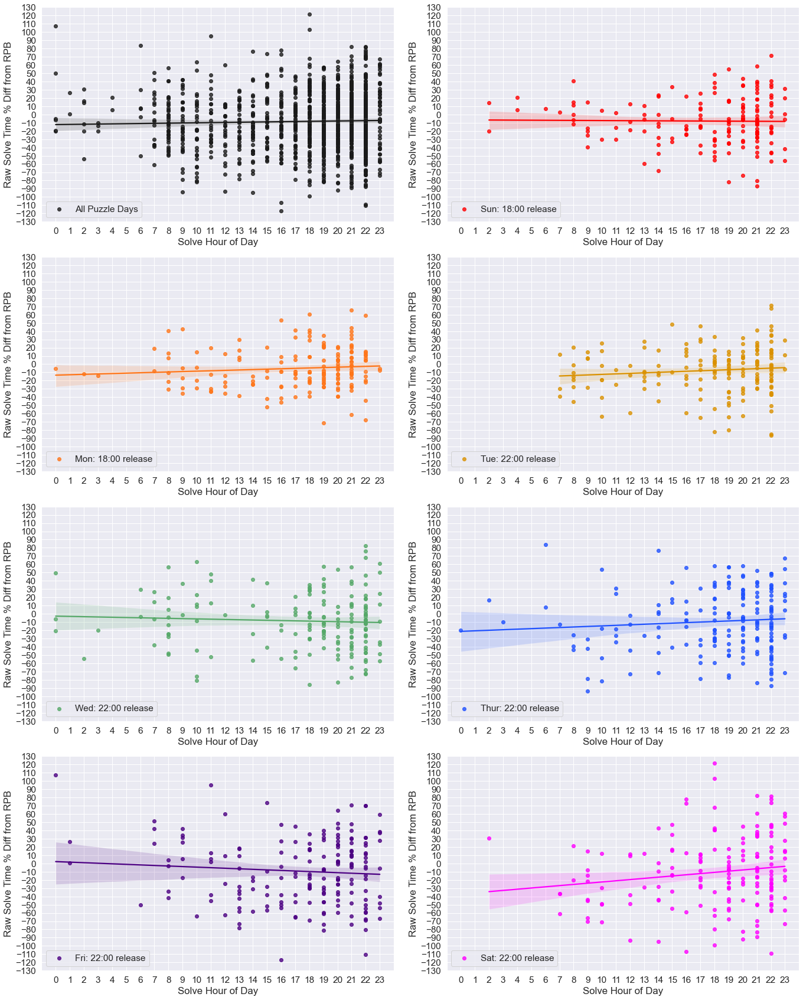

In [249]:
# Individual Solver 2 (IS2) Puzzle Completions by Solve Hour
# Figure 9

IS2_df2a = IS2_df2a.sort_values(by=['DOW_num'], ascending = True)

IS2_df2a['plot_seq_map'] = IS2_df2a['DOW_num'].map({0: 'All Puzzle Days', 1:'Sun: 18:00 release', 2:'Mon: 18:00 release', 3:'Tue: 22:00 release', 4:'Wed: 22:00 release', 5: 'Thur: 22:00 release', 6:'Fri: 22:00 release', 7:'Sat: 22:00 release'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df2a, x="Comp_Hr", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], col_wrap=2, palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False
).set(title="", xlabel= "Solve Hour of Day",
    ylabel="Raw Solve Time % Diff from RPB", yticks = [-130,-120,-110,-100,-90,-80,-70,-60,-50,-40,-30,-20,-10,0,10,20,30,40,50,60,70,80,90,100,110,120,130], xticks = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]  
)

#Adjust subplots individually
p.axes[0].set_ylim((-130,130))
p.axes[0].set_xlim((-1,24))
p.axes[1].set_ylim((-130,130))
p.axes[1].set_xlim((-1,24))
p.axes[2].set_ylim((-130,130))
p.axes[2].set_xlim((-1,24))
p.axes[3].set_ylim((-130,130))
p.axes[3].set_xlim((-1,24))
p.axes[4].set_ylim((-130,130))
p.axes[4].set_xlim((-1,24))
p.axes[5].set_ylim((-130,130))
p.axes[5].set_xlim((-1,24))
p.axes[6].set_ylim((-130,130))
p.axes[6].set_xlim((-1,24))
p.axes[7].set_ylim((-130,130))
p.axes[7].set_xlim((-1,24))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'lower left', title="")
_= p.axes[1].legend(loc = 'lower left')
_= p.axes[2].legend(loc = 'lower left')
_= p.axes[3].legend(loc = 'lower left')
_= p.axes[4].legend(loc = 'lower left')
_= p.axes[5].legend(loc = 'lower left')
_= p.axes[6].legend(loc = 'lower left')
_= p.axes[7].legend(loc = 'lower left')

IS2_df2a.drop(['plot_seq_map'], axis=1, inplace=True)

In [250]:
#counts of common hours for puzzle completion for IS1
#Figure 9

print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 18)]))
print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 21)]))
print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 0)]))

print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 7) & (IS2_df2["Comp_Hr"] <= 10)]))

807
431
1230
121


In [251]:
#Figure 9

print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 0) & (IS2_df2["Comp_Hr"] <= 8)]))
print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 0) & (IS2_df2["Comp_Hr"] <= 8) & (IS2_df2["IST_Diff%_from_IS_pds_l10_dw"] <= -50)]))

81
2


In [252]:
#Figure 9

print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 20) & (IS2_df2["Comp_Hr"] <= 24)]))
print(len(IS2_df2.loc[(IS2_df2["Comp_Hr"] >= 20) & (IS2_df2["Comp_Hr"] <= 23) & (IS2_df2["IST_Diff%_from_IS_pds_l10_dw"] <= -50)]))

565
65


### Correlation of Puzzle, Answer and Past Performance Feature Parameters to Individual IS2 Puzzle Solve Times 

In [253]:
# Make a deep copy of individual solver df
IS2_df3 = IS2_df2.copy()

In [254]:
IS2_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1230 entries, 279 to 54
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1230 non-null   datetime64[ns]
 1   P_Date_str                             1230 non-null   object        
 2   P_Yr                                   1230 non-null   period[A-DEC] 
 3   2023+_puzzle                           1230 non-null   float64       
 4   DOW                                    1230 non-null   object        
 5   DOW_num                                1230 non-null   float64       
 6   GMST(m)                                1230 non-null   float64       
 7   GMST(m)_10p_MA                         1230 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1230 non-null   int64         
 9   Comp_Hr                                1230 non-null   int64   

In [255]:
# Restricting time range to beginning of 2020 onward to minimize baseline shift effects on correlations to puzzle features

IS2_df4 = IS2_df3.loc[(IS2_df3["Comp_Yr"]==("2020")) | (IS2_df3["Comp_Yr"]==("2021")) |(IS2_df3["Comp_Yr"]==("2022")) | (IS2_df3["Comp_Yr"]==("2023")) | (IS2_df3["Comp_Yr"]==("2024"))]

# #print(df_IS1.loc[df_IS1["Comp_Yr"]==("2021"), "IST(m)"].sum())

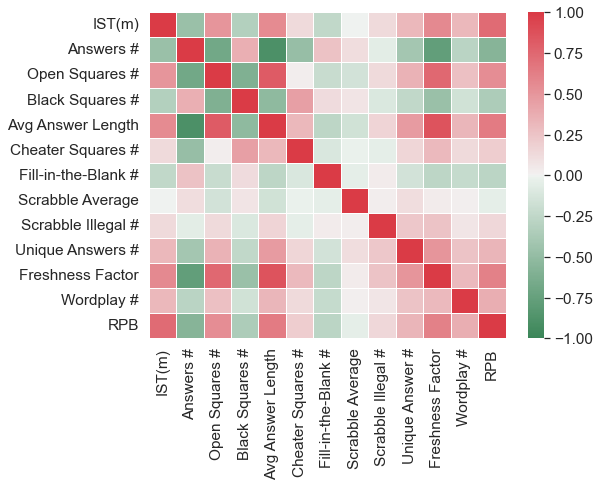

In [256]:
# 15x15 Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
#Figure 10

IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]
puzzle_features = IS2_15x15[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',    
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triangle - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #','RPB'])
#_= ans.set_yticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Average Answer Length', 'Rebus #', 'Cheater Squares #', 'Fill in the Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Recent Adj Perf', 'Past Perf vs Constructor(s)'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [257]:
IS2_15x15.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 979 entries, 279 to 54
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 979 non-null    datetime64[ns]
 1   P_Date_str                             979 non-null    object        
 2   P_Yr                                   979 non-null    period[A-DEC] 
 3   2023+_puzzle                           979 non-null    float64       
 4   DOW                                    979 non-null    object        
 5   DOW_num                                979 non-null    float64       
 6   GMST(m)                                979 non-null    float64       
 7   GMST(m)_10p_MA                         979 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             979 non-null    int64         
 9   Comp_Hr                                979 non-null    int64    

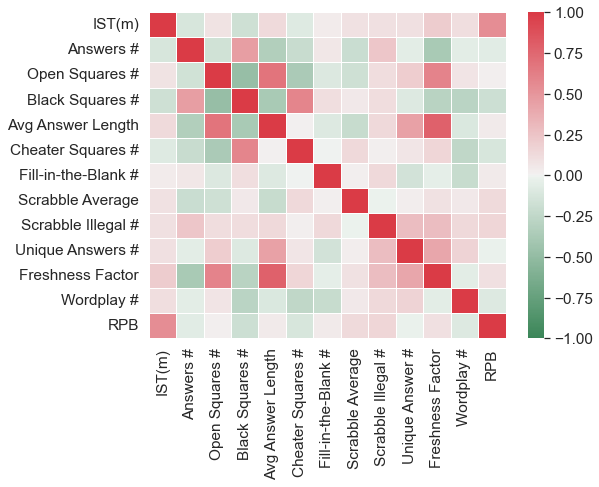

In [258]:
# 21x21 (Sunday) Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map
#Figure 10

IS2_21x21 = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
puzzle_features = IS2_21x21[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',     
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [259]:
IS2_21x21.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 153 entries, 759 to 981
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 153 non-null    datetime64[ns]
 1   P_Date_str                             153 non-null    object        
 2   P_Yr                                   153 non-null    period[A-DEC] 
 3   2023+_puzzle                           153 non-null    float64       
 4   DOW                                    153 non-null    object        
 5   DOW_num                                153 non-null    float64       
 6   GMST(m)                                153 non-null    float64       
 7   GMST(m)_10p_MA                         153 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             153 non-null    int64         
 9   Comp_Hr                                153 non-null    int64   

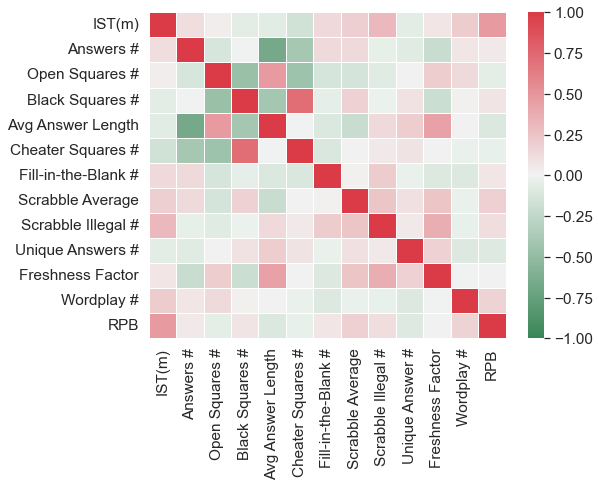

In [260]:
# Monday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
puzzle_features = IS2_df4_Mon[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

In [261]:
IS2_df4_Mon.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 153 entries, 758 to 782
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 153 non-null    datetime64[ns]
 1   P_Date_str                             153 non-null    object        
 2   P_Yr                                   153 non-null    period[A-DEC] 
 3   2023+_puzzle                           153 non-null    float64       
 4   DOW                                    153 non-null    object        
 5   DOW_num                                153 non-null    float64       
 6   GMST(m)                                153 non-null    float64       
 7   GMST(m)_10p_MA                         153 non-null    float64       
 8   GMST_Diff%_from_GMS_10p_MA             153 non-null    int64         
 9   Comp_Hr                                153 non-null    int64   

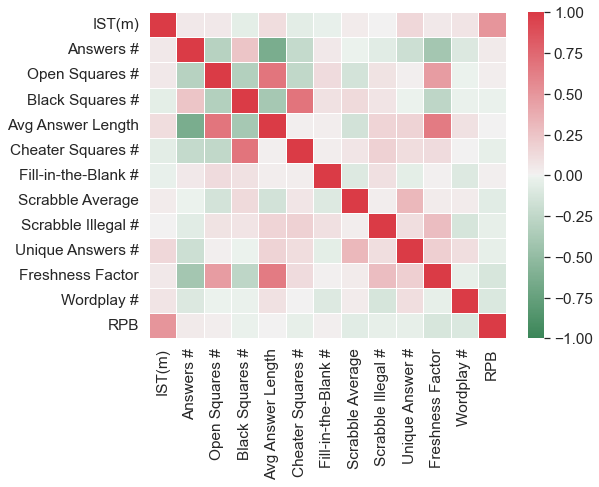

In [262]:
# Tuesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
puzzle_features = IS2_df4_Tue[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'IS_pds_l10_dw': 'RPB'    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

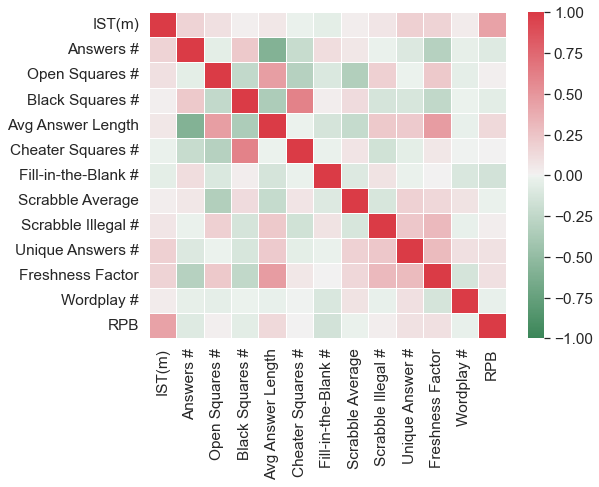

In [263]:
# Wednesday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
puzzle_features = IS2_df4_Wed[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay': 'Wordplay #',
'IS_pds_l10_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

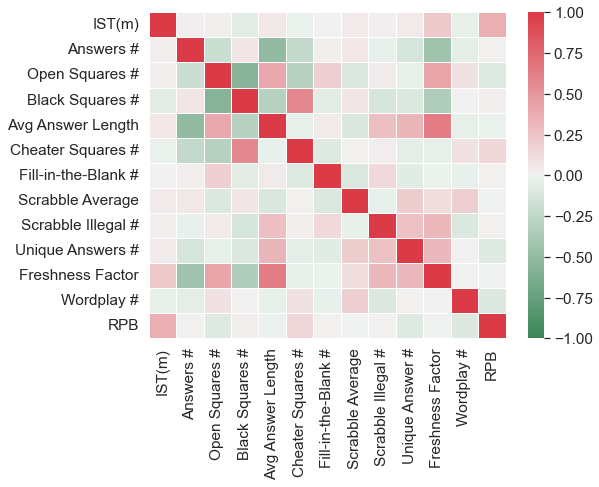

In [264]:
# Thursday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Thurs = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
puzzle_features = IS2_df4_Thurs[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',    
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RPB',    
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])
#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

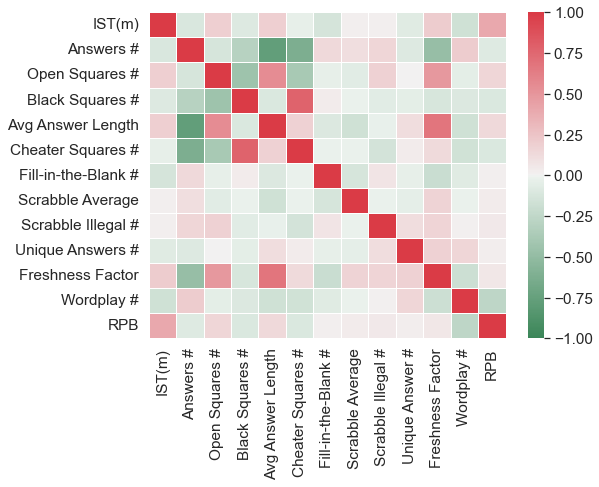

In [265]:
# Friday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
puzzle_features = IS2_df4_Fri[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RPB'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

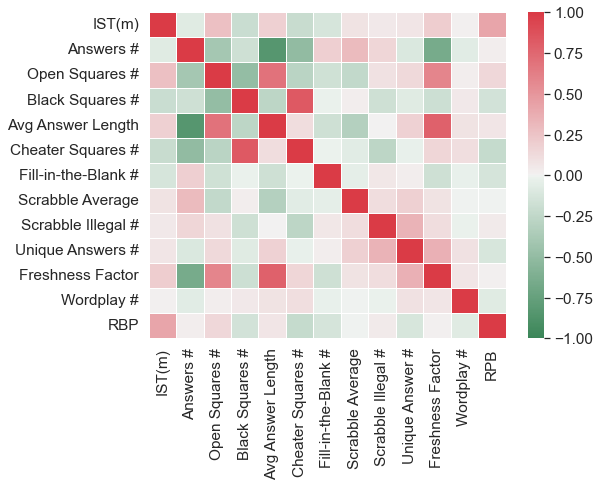

In [266]:
# Saturday Puzzles Features Correlation to Individual Solver Raw Solve Times Heat Map

IS2_df4_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
puzzle_features = IS2_df4_Sat[["IST(m)", "Words", "Open_Squares", "Blocks", "AWL", "Cheater_Squares", "FITB", "Scrabble_Avg", "Scrabble_Illegal", "Unique_Answers", "Freshness_Factor", "Wordplay", "IS_pds_l10_dw"]]

corr = puzzle_features.corr()

labels = {
'IST(m)':'IST(m)',  
'Words':'Answers #', 
'Open_Squares':'Open Squares #',
'Blocks': 'Black Squares #',
'AWL':'Avg Answer Length',   
'Cheater_Squares':'Cheater Squares #',
'FITB':'Fill-in-the-Blank #',
'Scrabble_Avg':'Scrabble Average',
'Scrabble_Illegal':'Scrabble Illegal #',
'Unique_Answers':'Unique Answers #',
'Freshness_Factor':'Freshness Factor',
'Wordplay':'Wordplay #',
'IS_pds_l10_dw': 'RBP'
}

corr = corr.rename(labels)

# remove the top right triange - duplicate information
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Colors
cmap = sns.diverging_palette(500, 10, as_cmap=True)

# uncomment this if want only the lower triangle matrix 
# ans=sns.heatmap(corr, mask=mask,  linewidths=1, cmap=cmap, center=0)
plt.figure(figsize=(8,6))
ans=sns.heatmap(corr,  linewidths=1, cmap=cmap, center=0, xticklabels=True, yticklabels=True, vmin=-1, vmax=1)

_= ans.set_xticklabels(['IST(m)', 'Answers #', 'Open Squares #', 'Black Squares #', 'Avg Answer Length', 'Cheater Squares #', 'Fill-in-the-Blank #', 'Scrabble Average', 'Scrabble Illegal #', 'Unique Answer #', 'Freshness Factor', 'Wordplay #', 'RPB'])

#save image 
# figure = ans.get_figure()    
# figure.savefig('correlations.png', dpi=800)

### Scatterplots of Relationship of Grid, Answer and Past-Performance Parameters to IS1 Per Puzzle Performance

In [122]:
IS2_df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1132 entries, 279 to 54
Data columns (total 55 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   P_Date                                 1132 non-null   datetime64[ns]
 1   P_Date_str                             1132 non-null   object        
 2   P_Yr                                   1132 non-null   period[A-DEC] 
 3   2023+_puzzle                           1132 non-null   float64       
 4   DOW                                    1132 non-null   object        
 5   DOW_num                                1132 non-null   float64       
 6   GMST(m)                                1132 non-null   float64       
 7   GMST(m)_10p_MA                         1132 non-null   float64       
 8   GMST_Diff%_from_GMS_10p_MA             1132 non-null   int64         
 9   Comp_Hr                                1132 non-null   int64   

In [123]:
# Create new df with all 15x15 puzzle rows copied and placed below current rows. 
# This is so we can plot all 15x15 data together as a subplot in the feature correlation scatterplot figures 

IS2_df4_copy = IS2_df4.loc[(IS2_df4["DOW_num"] != 1)] #15x15 only
IS2_df4_copy["DOW_num"] = 0

IS2_df4a = pd.concat([IS2_df4, IS2_df4_copy],ignore_index=True)

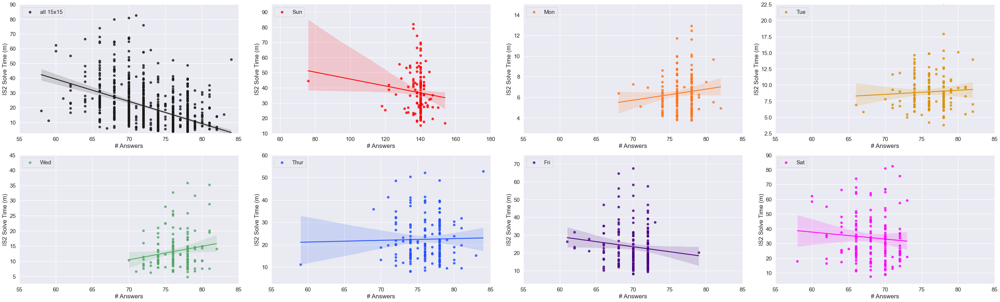

In [124]:
# Number of Answers vs IS2 Raw Solve Times
# non-normed version
# Fig. 11

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Words", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

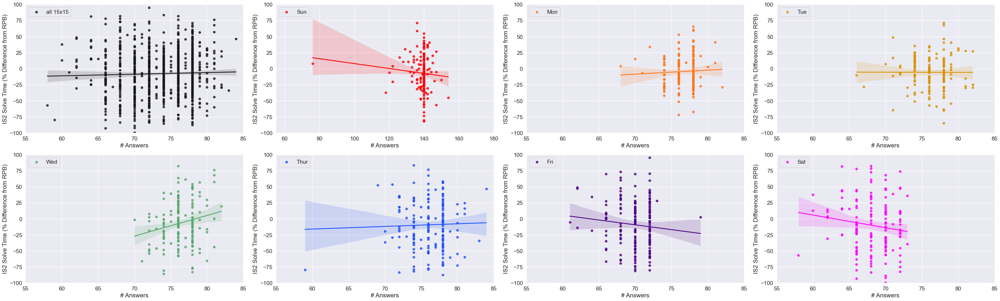

In [125]:
# Number of Answers vs IS2 Raw Solve Times
# RPB normed version
# Fig. 11

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Words", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Answers",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((55,85))
p.axes[1].set_xlim((55,180))
p.axes[2].set_xlim((55,85))
p.axes[3].set_xlim((55,85))
p.axes[4].set_xlim((55,85))
p.axes[5].set_xlim((55,85))
p.axes[6].set_xlim((55,85))
p.axes[7].set_xlim((55,85))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [126]:
# Calculate IS2 Pearson R for 15x15 grids for this feature
IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")] #only need to filter down this one time, and can apply to correlations for all subsequent features analysed

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Words']))

-0.4685068429986608


In [127]:
# Calculate GMS Pearson R for 15x15 grids for this feature

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Words']))

-0.5500270888485032


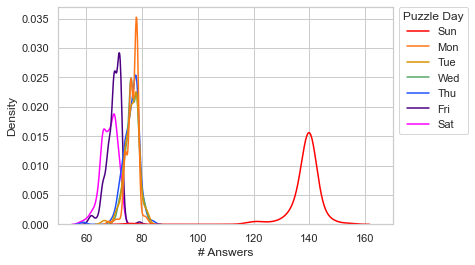

In [128]:
# Density plot of number of answers in puzzles solved by IS2
# Fig. 11

IS2_df4['plot_seq_map'] = IS2_df4['DOW_num'].map({1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5:'Thu', 6:'Fri', 7:'Sat'})
IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Words", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(50, 170)
ax.set_xlabel("# Answers")
plt.show()

In [129]:
IS2_df4["Words"].agg(['min', 'max'])

min     58
max    154
Name: Words, dtype: int64

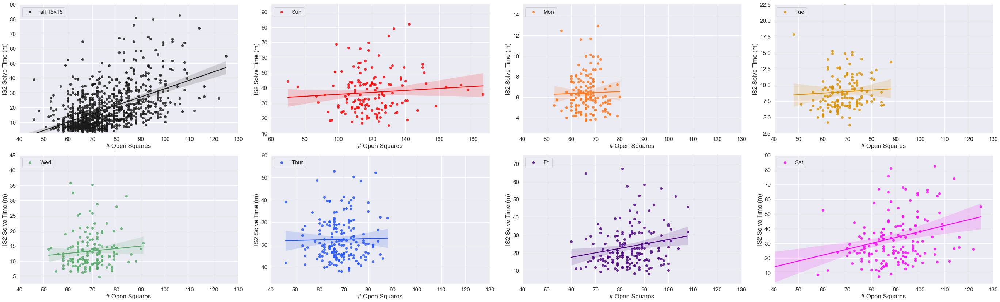

In [130]:
# Open Squares vs IS2 Raw Solve Times
# non-normed version
# Fig. 12

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Open_Squares", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

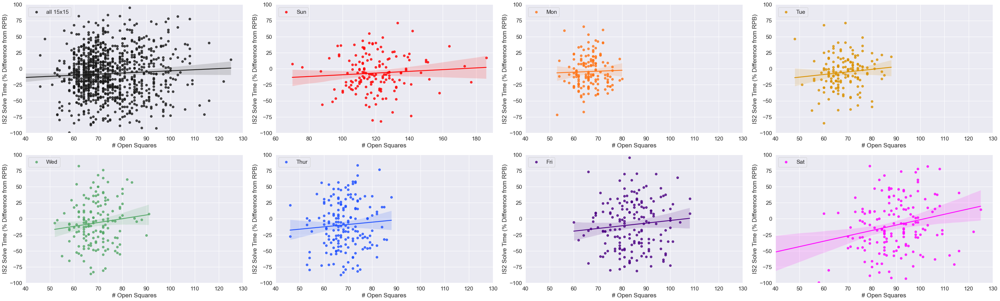

In [131]:
# Open Squares vs IS2 Raw Solve Times
# RPB normed version
# Fig. 12

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Open_Squares", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Open Squares",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((40,130))
p.axes[1].set_xlim((60,190))
p.axes[2].set_xlim((40,130))
p.axes[3].set_xlim((40,130))
p.axes[4].set_xlim((40,130))
p.axes[5].set_xlim((40,130))
p.axes[6].set_xlim((40,130))
p.axes[7].set_xlim((40,130))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [132]:
# Calculate IS2 Pearson R for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Open_Squares']))

0.5033627233738218


In [133]:
# Calculate GMS Pearson R for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Open_Squares']))

0.5642044781325374


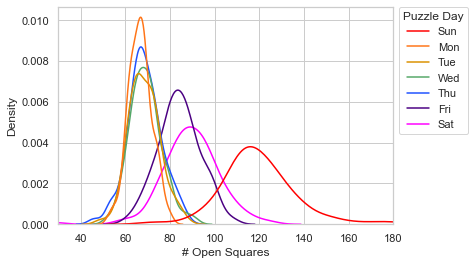

In [134]:
# Density plot of number of open squares in puzzles solved by IS2
# Fig. 12

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Open_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(30, 180)
ax.set_xlabel("# Open Squares")
plt.show()

In [135]:
IS2_df4["Open_Squares"].agg(['min', 'max'])

min     29
max    186
Name: Open_Squares, dtype: int64

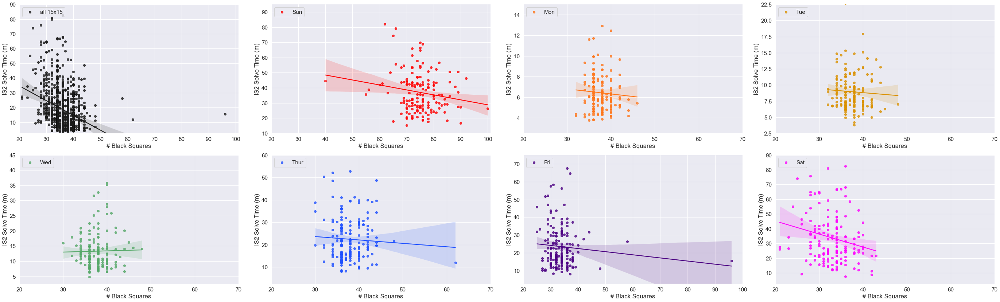

In [136]:
# Black Squares (blocks) vs IS2 Raw Solve Times
# non-normed version
# Fig. 13

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Blocks", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

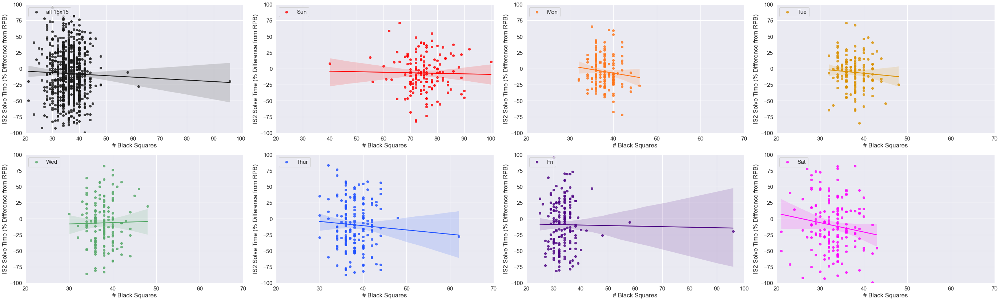

In [137]:
# Black Squares (blocks) vs IS2 Raw Solve Times
# RPB normed version
# Fig. 13

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Blocks", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Black Squares",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((20,101))
p.axes[1].set_xlim((20,101))
p.axes[2].set_xlim((20,70))
p.axes[3].set_xlim((20,70))
p.axes[4].set_xlim((20,70))
p.axes[5].set_xlim((20,70))
p.axes[6].set_xlim((20,100))
p.axes[7].set_xlim((20,70))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [138]:
# Calculate Pearson R for IS2 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Blocks']))

-0.3219527950881692


In [139]:
# Calculate Pearson R for GMS 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Blocks']))

-0.3592255515682165


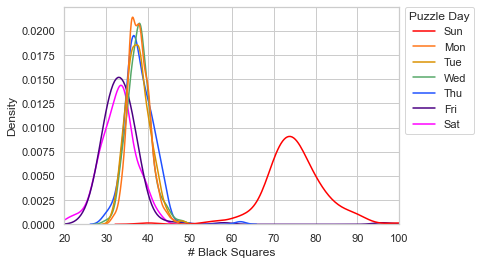

In [140]:
# Density plot of number of black squares (blocks) in puzzles solved by IS2
# Fig. 13

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Blocks", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(20, 100)
ax.set_xlabel("# Black Squares")
plt.show()

In [141]:
IS2_df4["Blocks"].agg(['min', 'max'])

min     21
max    100
Name: Blocks, dtype: int64

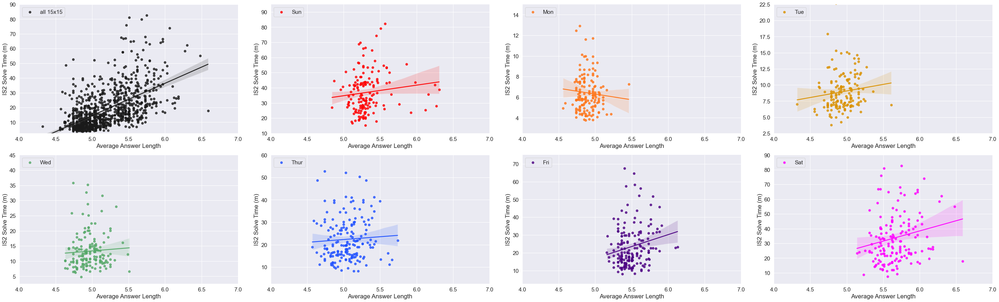

In [142]:
# Average Answer Length vs IS2 Raw Solve Times
# non-normed version
# Fig. 14

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="AWL", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

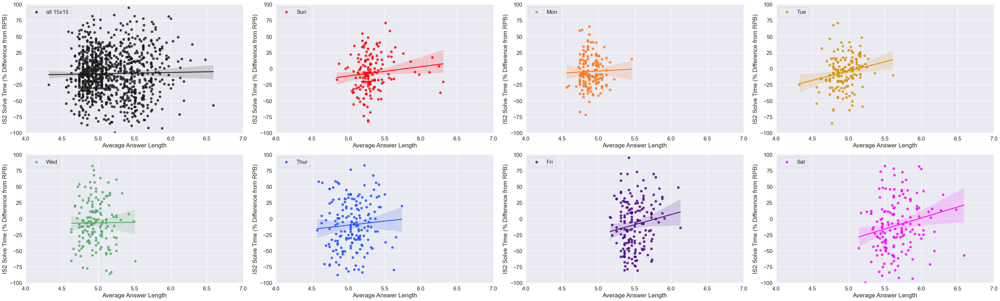

In [143]:
# Average Answer Length vs IS2 Raw Solve Times
# RPB Normed Version
# Fig. 14

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="AWL", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Average Answer Length",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((4,7))
p.axes[1].set_xlim((4,7))
p.axes[2].set_xlim((4,7))
p.axes[3].set_xlim((4,7))
p.axes[4].set_xlim((4,7))
p.axes[5].set_xlim((4,7))
p.axes[6].set_xlim((4,7))
p.axes[7].set_xlim((4,7))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [144]:
# Calculate Pearson R for IS2 for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['AWL']))

0.5588306660020432


In [145]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['AWL']))

0.6619339043126028


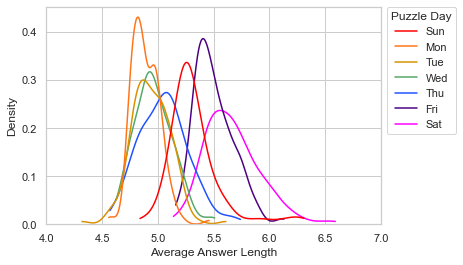

In [146]:
# Density plot of average answer length in puzzles solved by IS2
# Fig. 14

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "AWL", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(3,7))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(4, 7)
ax.set_xlabel("Average Answer Length")
plt.show()

In [147]:
IS2_df4["AWL"].agg(['min', 'max'])

min    4.32
max    6.59
Name: AWL, dtype: float64

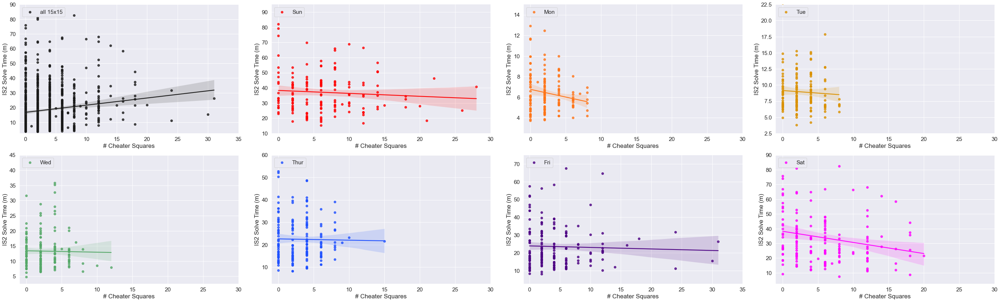

In [148]:
# Cheater Squares vs IS2 Raw Solve Times
# non-normed version
# Fig. 15

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Cheater_Squares", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

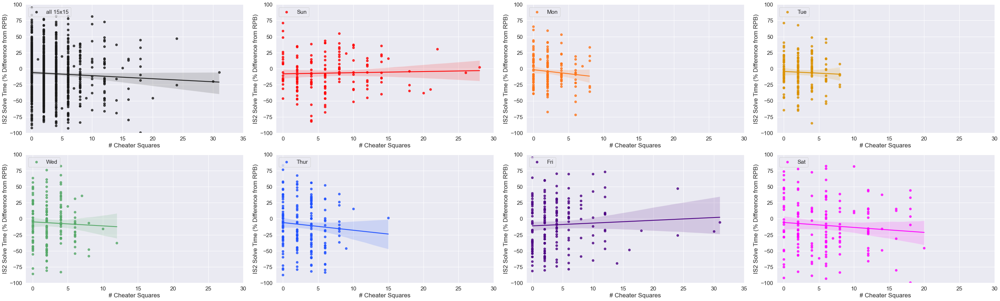

In [149]:
# Cheater Squares vs IS2 Raw Solve Times
# RPB normed version
# Fig. 15

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Cheater_Squares", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Cheater Squares",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,35))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,35))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [150]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Cheater_Squares']))

0.13111520666566961


In [151]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Cheater_Squares']))

0.19472810654656394


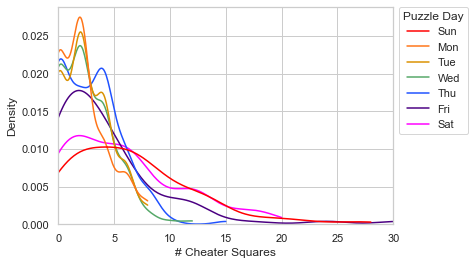

In [152]:
# Density plot of number of cheater squares in puzzles solved by IS2
# Fig. 15

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Cheater_Squares", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,30))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 30)
ax.set_xlabel("# Cheater Squares")
plt.show()

In [153]:
IS2_df4["Cheater_Squares"].agg(['min', 'max'])

min     0
max    31
Name: Cheater_Squares, dtype: int64

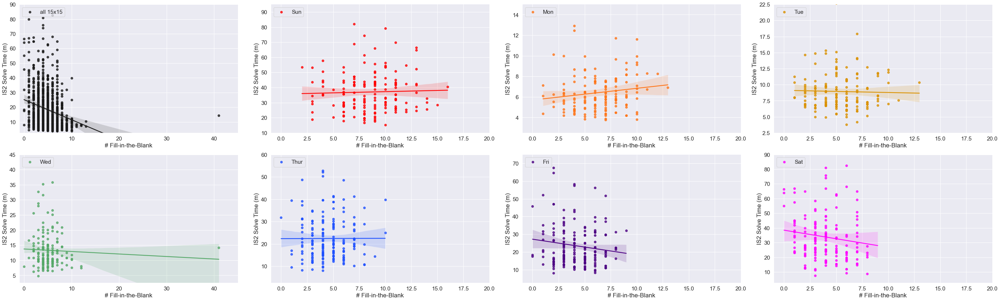

In [154]:
# Fill-in-the-blank clues vs IS2 Raw Solve Times
# non-normed version
# Fig. 16

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="FITB", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

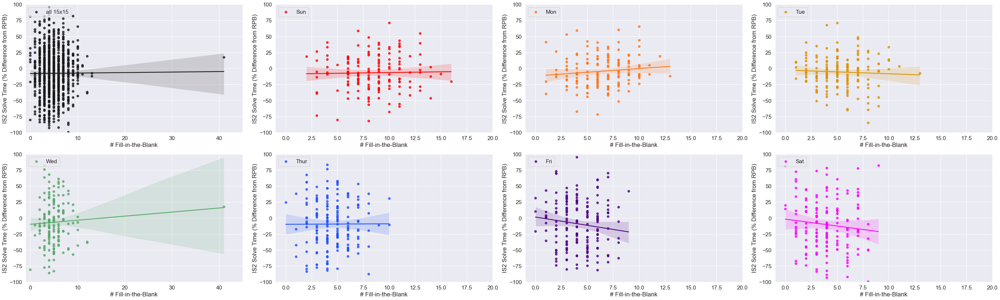

In [155]:
# Fill-in-the-blank clues vs IS2 Raw Solve Times
# RPB normed version
# Fig. 16

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="FITB", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Fill-in-the-Blank",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,45))
p.axes[1].set_xlim((-1,20))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,45))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [156]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['FITB']))

-0.2452558150773823


In [157]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['FITB']))

-0.2568142955269834


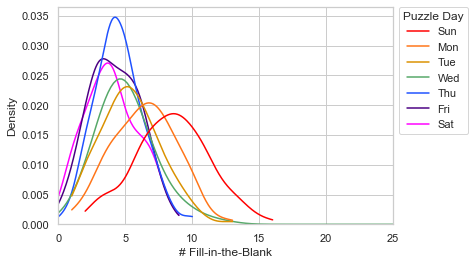

In [158]:
# Density plot of number of fill-in-the-blank clues in puzzles solved by IS2
# Fig. 16

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "FITB", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,45))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Fill-in-the-Blank")
plt.show()

In [159]:
IS2_df4["FITB"].agg(['min', 'max'])

min     0
max    41
Name: FITB, dtype: int64

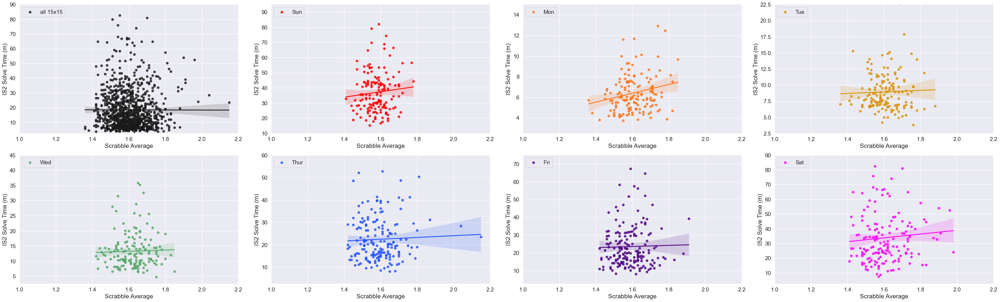

In [160]:
# Scrabble Average vs IS2 Raw Solve Times
# non-normed version
# Fig. 17

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Scrabble_Avg", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

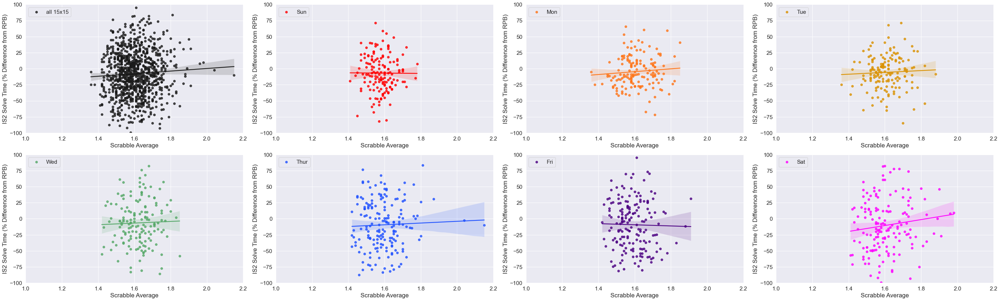

In [161]:
# Scrabble Average vs IS2 Raw Solve Times
# RPB normed version
# Fig. 17

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Scrabble_Avg", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Scrabble Average",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((1,2.2))
p.axes[1].set_xlim((1,2.2))
p.axes[2].set_xlim((1,2.2))
p.axes[3].set_xlim((1,2.2))
p.axes[4].set_xlim((1,2.2))
p.axes[5].set_xlim((1,2.2))
p.axes[6].set_xlim((1,2.2))
p.axes[7].set_xlim((1,2.2))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [162]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Scrabble_Avg']))

-0.0016544682886329655


In [163]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Scrabble_Avg']))

-0.020987263361097155


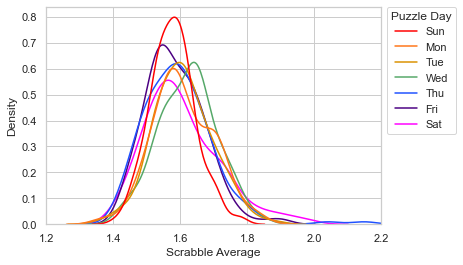

In [164]:
# Density plot of Scrabble Average in puzzles solved by IS2
# Fig. 17

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Scrabble_Avg", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(1.2, 2.2)
ax.set_xlabel("Scrabble Average")
plt.show()

In [165]:
IS2_df4["Scrabble_Avg"].agg(['min', 'max'])

min    1.36
max    2.15
Name: Scrabble_Avg, dtype: float64

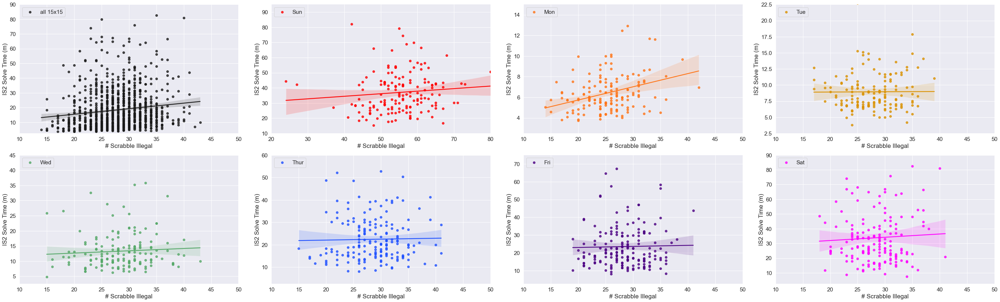

In [166]:
# Scrabble Illegal # vs IS2 Raw Solve Times
# non-normed version
# Fig. 18

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Scrabble_Illegal", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

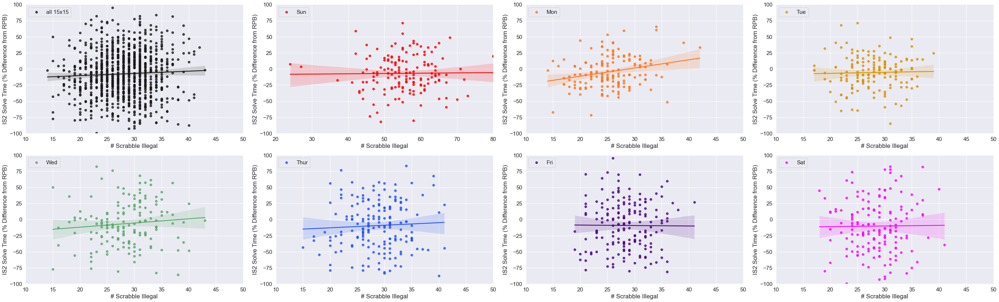

In [167]:
# Scrabble Illegal # vs IS2 Raw Solve Times
# RPB normed version
# Fig. 18

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Scrabble_Illegal", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Scrabble Illegal",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,50))
p.axes[1].set_xlim((20,80))
p.axes[2].set_xlim((10,50))
p.axes[3].set_xlim((10,50))
p.axes[4].set_xlim((10,50))
p.axes[5].set_xlim((10,50))
p.axes[6].set_xlim((10,50))
p.axes[7].set_xlim((10,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [168]:
# Calculate Pearson R for IS2 for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Scrabble_Illegal']))

0.1311102585619526


In [169]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Scrabble_Illegal']))

0.18311680482777962


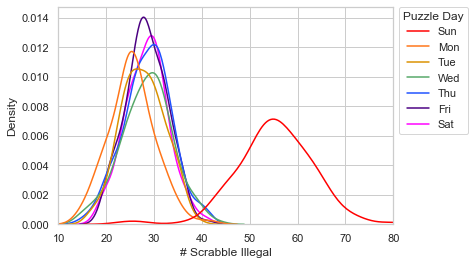

In [170]:
# Density plot of Scrabble Illegal # in puzzles solved by IS2
# Fig. 18

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Scrabble_Illegal", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 80)
ax.set_xlabel("# Scrabble Illegal")
plt.show()

In [171]:
IS2_df4["Scrabble_Illegal"].agg(['min', 'max'])

min    14
max    80
Name: Scrabble_Illegal, dtype: int64

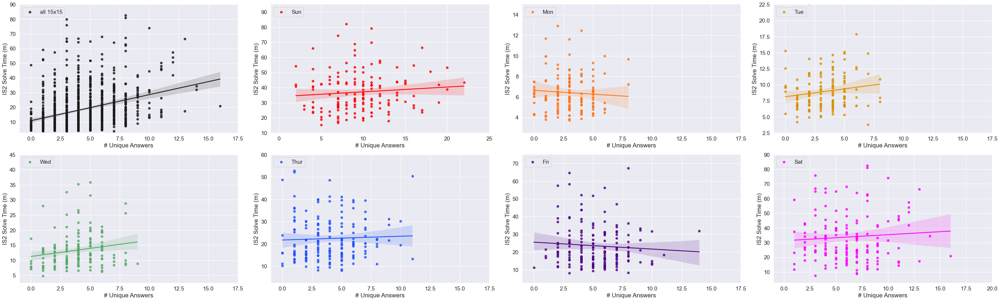

In [172]:
# Unique Answers # # vs IS2 Raw Solve Times
# non-normed version
# Fig. 19

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Unique_Answers", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

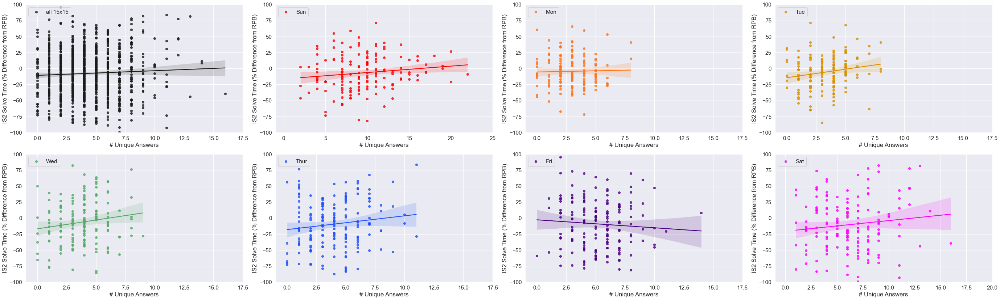

In [173]:
# Unique Answers # # vs IS2 Raw Solve Times
# RPB-normed version
# Fig. 19

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Unique_Answers", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Unique Answers",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,17.5))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,17.5))
p.axes[3].set_xlim((-1,17.5))
p.axes[4].set_xlim((-1,17.5))
p.axes[5].set_xlim((-1,17.5))
p.axes[6].set_xlim((-1,17.5))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [174]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Unique_Answers']))

0.31367579177595006


In [175]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Unique_Answers']))

0.39586147317495657


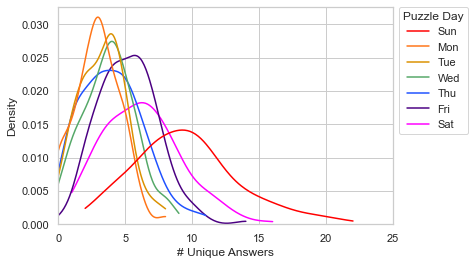

In [176]:
# Density plot of Unique Answers # in puzzles solved by IS2
# Fig. 19

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Unique_Answers", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True, cut=0, clip=(0,25))

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(0, 25)
ax.set_xlabel("# Unique Answers")
plt.show()

In [177]:
IS2_df4["Unique_Answers"].agg(['min', 'max'])

min     0
max    22
Name: Unique_Answers, dtype: int64

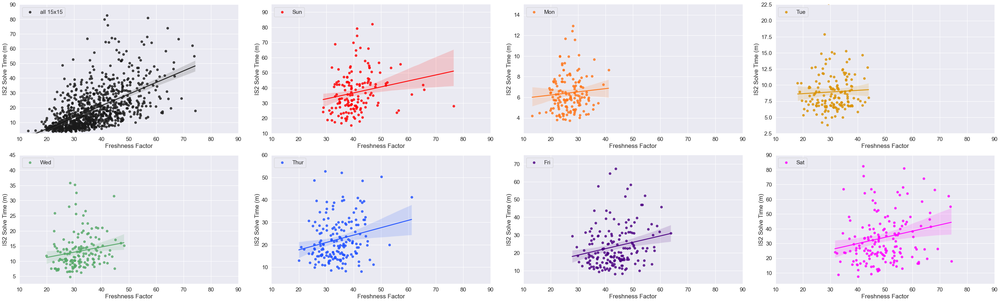

In [178]:
# Freshness Factor vs IS2 Raw Solve Times
# non-normed version
# Fig. 20

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Freshness_Factor", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

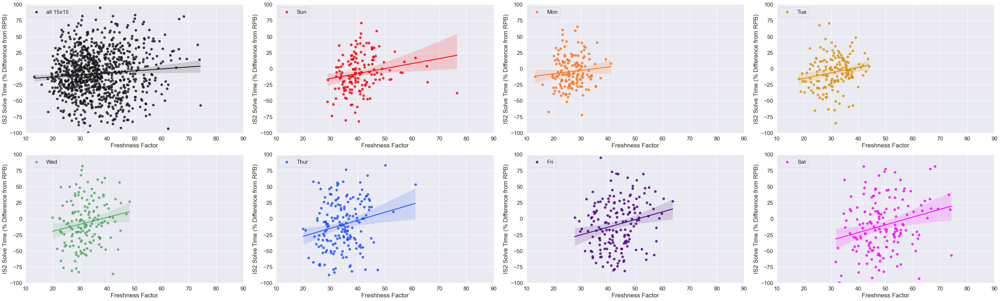

In [179]:
# Freshness Factor vs IS2 Raw Solve Times
# RPB normalized version
# Fig. 20

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Freshness_Factor", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "Freshness Factor",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((10,90))
p.axes[1].set_xlim((10,90))
p.axes[2].set_xlim((10,90))
p.axes[3].set_xlim((10,90))
p.axes[4].set_xlim((10,90))
p.axes[5].set_xlim((10,90))
p.axes[6].set_xlim((10,90))
p.axes[7].set_xlim((10,90))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [180]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Freshness_Factor']))

0.5686057243761998


In [181]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Freshness_Factor']))

0.672012747692323


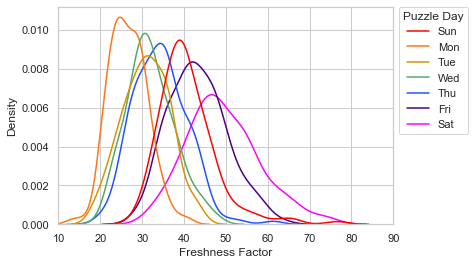

In [182]:
# Density plot of Freshness Factor in puzzles solved by IS2
# Fig. 20

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Freshness_Factor", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(10, 90)
ax.set_xlabel("Freshness Factor")
plt.show()

In [183]:
IS2_df4["Freshness_Factor"].agg(['min', 'max'])

min    13.2
max    76.5
Name: Freshness_Factor, dtype: float64

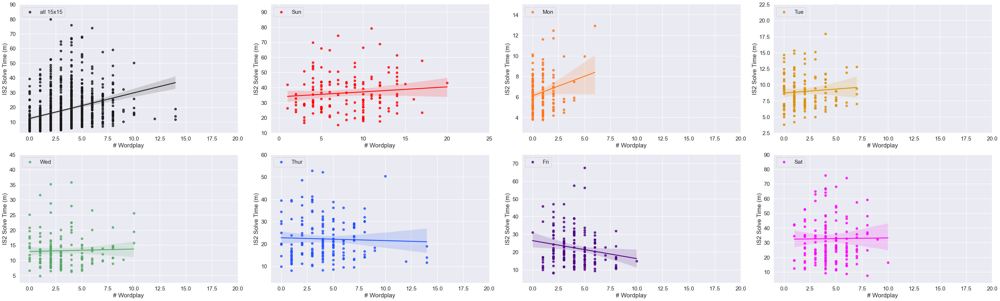

In [184]:
# Wordplay vs IS2 Raw Solve Times
# non-normed version
# Fig. 21

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Wordplay", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

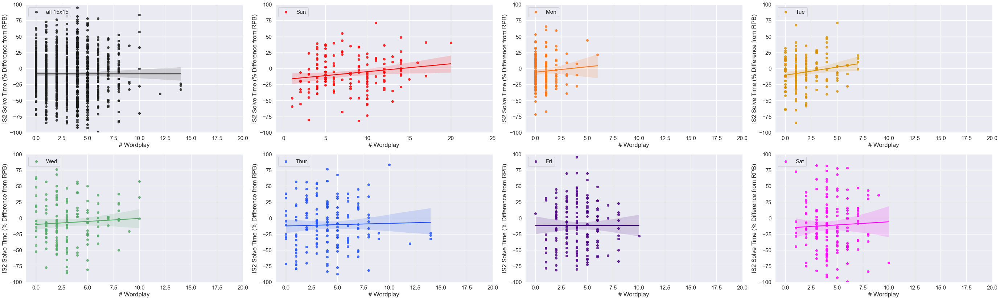

In [185]:
# Wordplay vs IS2 Raw Solve Times
# RPB normed version
# Fig. 21

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Wordplay", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Wordplay",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,20))
p.axes[1].set_xlim((-1,25))
p.axes[2].set_xlim((-1,20))
p.axes[3].set_xlim((-1,20))
p.axes[4].set_xlim((-1,20))
p.axes[5].set_xlim((-1,20))
p.axes[6].set_xlim((-1,20))
p.axes[7].set_xlim((-1,20))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [186]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Wordplay']))

0.3143607728410157


In [187]:
# Calculate Pearson R for 15x15 grids for GMS for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Wordplay']))

0.44454824255882136


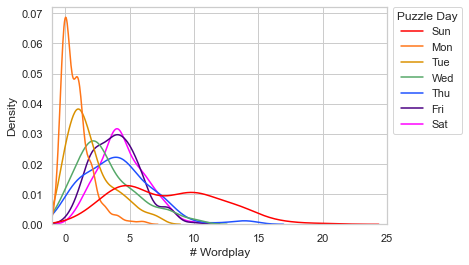

In [188]:
# Density plot of Wordplay in puzzles solved by IS2
# Fig. 21

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Wordplay", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 25)
ax.set_xlabel("# Wordplay")
plt.show()

In [189]:
IS2_df4["Wordplay"].agg(['min', 'max'])

min     0.0
max    20.0
Name: Wordplay, dtype: float64

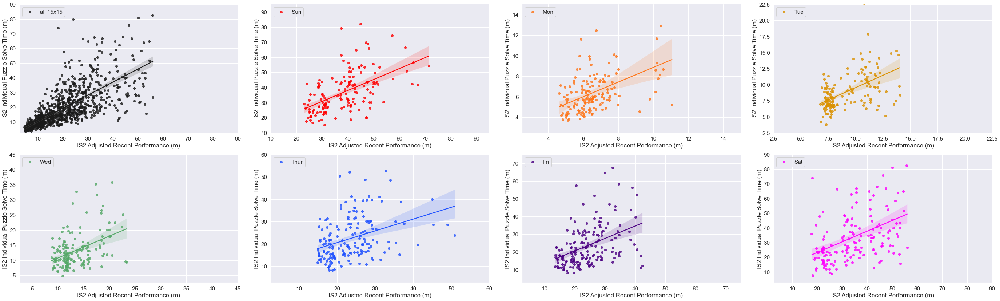

In [190]:
# IS2 Recent Past Performance (NON-Time-Decay Weighted Immediately Previous 10 Puzzles Prior to a given puzzle) vs IS2 Raw Solve Times

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="IS_pds_l10_dw", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "IS2 Adjusted Recent Performance (m)",
    ylabel="IS2 Individual Puzzle Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((2.5,90))
p.axes[1].set_xlim((10,95))
p.axes[2].set_xlim((2.5,15))
p.axes[3].set_xlim((2.5,22.5))
p.axes[4].set_xlim((2.5,45))
p.axes[5].set_xlim((2.5,60))
p.axes[6].set_xlim((2.5,75))
p.axes[7].set_xlim((2.5,90))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [191]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['IS_pds_l10_dw']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['IST(m)'].corr(IS2_Sun['IS_pds_l10_dw']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['IST(m)'].corr(IS2_Mon['IS_pds_l10_dw']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['IST(m)'].corr(IS2_Tue['IS_pds_l10_dw']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['IST(m)'].corr(IS2_Wed['IS_pds_l10_dw']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['IST(m)'].corr(IS2_Thu['IS_pds_l10_dw']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['IST(m)'].corr(IS2_Fri['IS_pds_l10_dw']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['IST(m)'].corr(IS2_Sat['IS_pds_l10_dw']))

0.7271577762250013
0.5442666629530657
0.4710249865909628
0.5020665379944697
0.42994256736134134
0.36540793535368954
0.40126730862659565
0.41584774429070737


### Data Supplement
Note: Supplementary Figures 1-3 calculated in the main figures and are labeled as such there. 

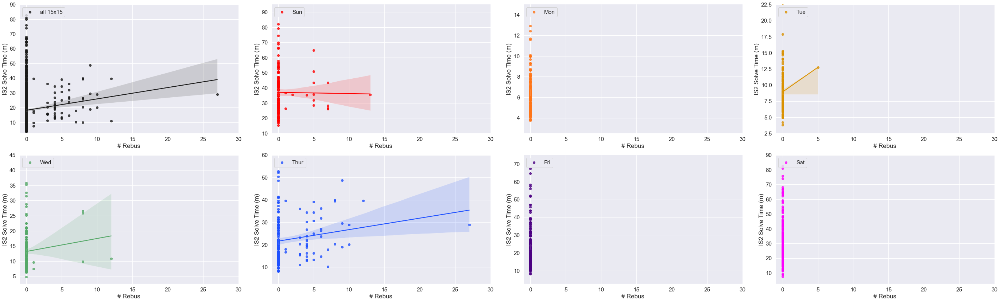

In [192]:
# Rebus vs IS2 Raw Solve Times
# non-normed version
# Supp. Fig. 4

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Rebus_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

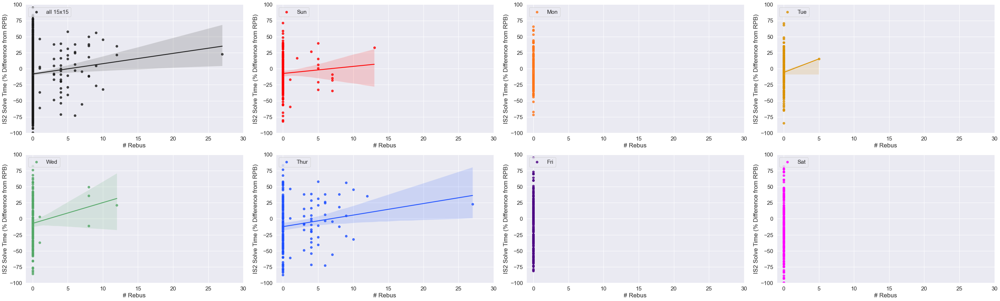

In [193]:
# Rebus vs IS2 Raw Solve Times
# RPB normed version
# Supp. Fig. 4

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Rebus_Count", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Rebus",
    ylabel="IS2 Solve Time (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,30))
p.axes[1].set_xlim((-1,30))
p.axes[2].set_xlim((-1,30))
p.axes[3].set_xlim((-1,30))
p.axes[4].set_xlim((-1,30))
p.axes[5].set_xlim((-1,30))
p.axes[6].set_xlim((-1,30))
p.axes[7].set_xlim((-1,30))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [194]:
# Calculate Pearson R for 15x15 grids for IS2 for this feature
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Rebus_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['IST(m)'].corr(IS2_Sun['Rebus_Count']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['IST(m)'].corr(IS2_Mon['Rebus_Count']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['IST(m)'].corr(IS2_Tue['Rebus_Count']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['IST(m)'].corr(IS2_Wed['Rebus_Count']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['IST(m)'].corr(IS2_Thu['Rebus_Count']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['IST(m)'].corr(IS2_Fri['Rebus_Count']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['IST(m)'].corr(IS2_Sat['Rebus_Count']))

0.08914934131215384
-0.0111959507869624
nan
0.10084259057672597
0.10778551479020629
0.1743741022003388
nan
nan


In [195]:
# Calculate Pearson R for 15x15 grids for GMST for this feature
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Rebus_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['GMST(m)'].corr(IS2_Sun['Rebus_Count']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['GMST(m)'].corr(IS2_Mon['Rebus_Count']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['GMST(m)'].corr(IS2_Tue['Rebus_Count']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['GMST(m)'].corr(IS2_Wed['Rebus_Count']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['GMST(m)'].corr(IS2_Thu['Rebus_Count']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['GMST(m)'].corr(IS2_Fri['Rebus_Count']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['GMST(m)'].corr(IS2_Sat['Rebus_Count']))

0.1349398740079581
0.15228844919005574
nan
0.15675823986079096
0.09111609258681688
0.2582240701479815
nan
nan


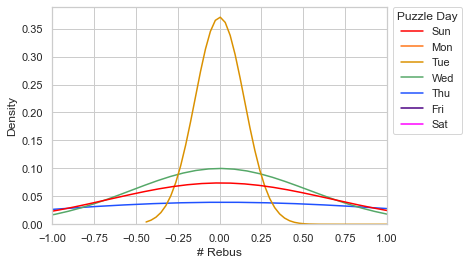

In [196]:
# Density plot of Rebus Count in puzzles solved by IS2
# Fig. S4

IS2_df4 = IS2_df4.sort_values(by=['DOW_num'], ascending = True)

sns.set(style="whitegrid")
ax = sns.kdeplot(data=IS2_df4, x = "Rebus_Count", hue= "plot_seq_map", palette=["red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"], legend=True)

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1.026), title='Puzzle Day')

plt.xlim(-1, 1)
ax.set_xlabel("# Rebus")
plt.show()

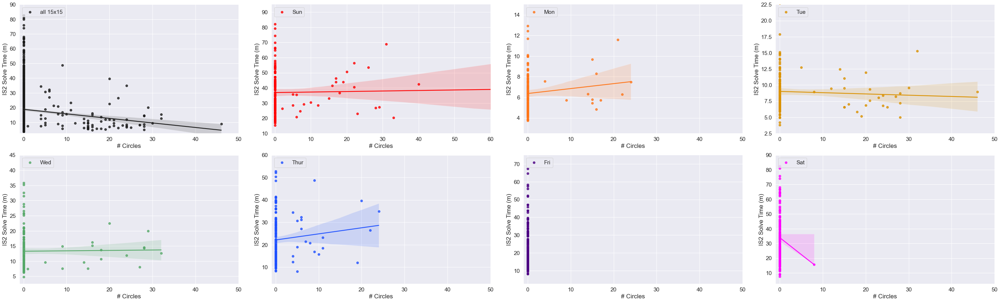

In [197]:
# Circles vs IS2 Raw Solve Times
# non-normed version
# Supp. Fig. 5

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Circle_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

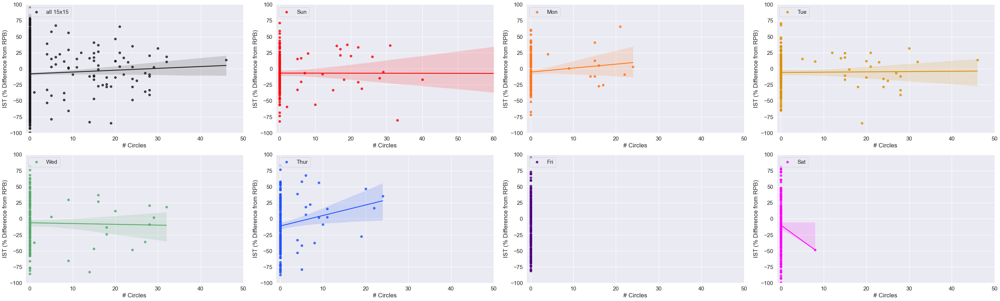

In [198]:
# Circles vs IS2 Raw Solve Times
#RPB normed version
#Supp. Fig. 5

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Circle_Count", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Circles",
    ylabel="IST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [199]:
# Calculate Pearson R for IS2 for 15x15 grids for Circle #
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Circle_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['IST(m)'].corr(IS2_Sun['Circle_Count']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['IST(m)'].corr(IS2_Mon['Circle_Count']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['IST(m)'].corr(IS2_Tue['Circle_Count']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['IST(m)'].corr(IS2_Wed['Circle_Count']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['IST(m)'].corr(IS2_Thu['Circle_Count']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['IST(m)'].corr(IS2_Fri['Circle_Count']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['IST(m)'].corr(IS2_Sat['Circle_Count']))

-0.11093566037161233
0.023479204560455907
0.10491292173512962
-0.055457956350815164
0.01486274112264534
0.10647515876164461
nan
-0.07760833488193299


In [200]:
# Calculate Pearson R for 15x15 grids for GMS for Circle #
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Circle_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['GMST(m)'].corr(IS2_Sun['Circle_Count']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['GMST(m)'].corr(IS2_Mon['Circle_Count']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['GMST(m)'].corr(IS2_Tue['Circle_Count']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['GMST(m)'].corr(IS2_Wed['Circle_Count']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['GMST(m)'].corr(IS2_Thu['Circle_Count']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['GMST(m)'].corr(IS2_Fri['Circle_Count']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['GMST(m)'].corr(IS2_Sat['Circle_Count']))

-0.1400983923860095
-0.028727115986215284
0.18907462144474205
0.01675152038191614
0.07246623406818291
-0.019482648836123297
nan
-0.043032648207424105


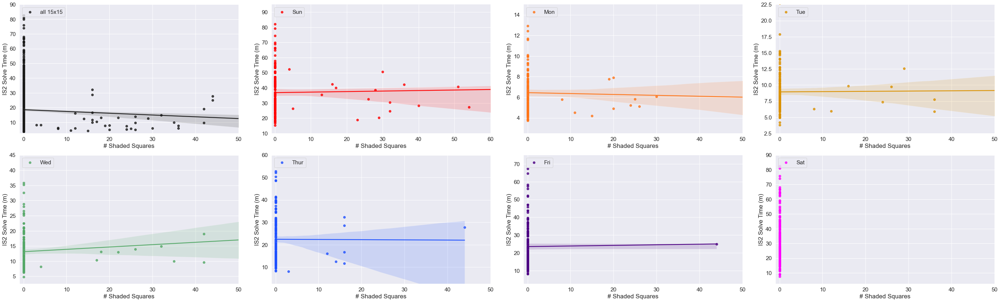

In [201]:
# Shaded Squares vs IS2 Raw Solve Times
# non-normed version
# Fig. S6

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Shade_Count", y="IST(m)", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="IS2 Solve Time (m)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((2.5,90))
p.axes[1].set_ylim((10,95))
p.axes[2].set_ylim((2.5,15))
p.axes[3].set_ylim((2.5,22.5))
p.axes[4].set_ylim((2.5,45))
p.axes[5].set_ylim((2.5,60))
p.axes[6].set_ylim((2.5,75))
p.axes[7].set_ylim((2.5,90))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

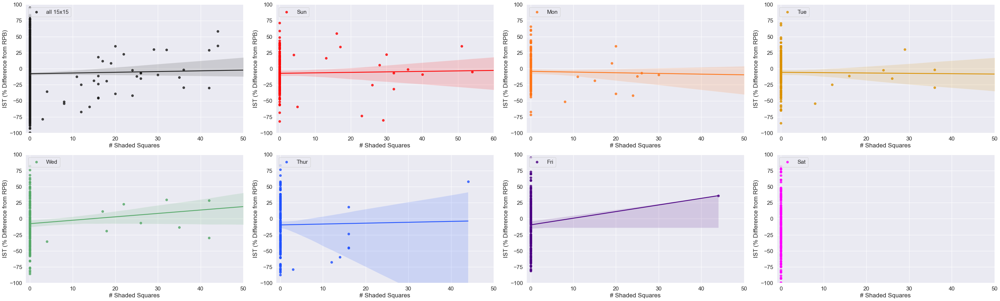

In [202]:
# Shaded Squares vs IS2 Raw Solve Times
# RPB normalized version
# Fig. S6

IS2_df4a = IS2_df4a.sort_values(by=['DOW_num'], ascending = True)

IS2_df4a['plot_seq_map'] = IS2_df4a['DOW_num'].map({0: 'all 15x15', 1:'Sun', 2:'Mon', 3:'Tue', 4:'Wed', 5: 'Thur', 6:'Fri', 7:'Sat'})

sns.set(font_scale=1.4)

p = sns.lmplot(
    data=IS2_df4a, x="Shade_Count", y="IST_Diff%_from_IS_pds_l10_dw", hue="plot_seq_map", col="DOW_num", col_order=[0, 1, 2, 3, 4, 5, 6, 7], palette=["k", "red", "#FF7518", "#da9100", "g", "#1F51FF", "indigo", "fuchsia"],
    sharey=False, sharex=False, height=6, aspect=1.6, legend=False, col_wrap=4
).set(title="", xlabel= "# Shaded Squares",
    ylabel="IST (% Difference from RPB)"
)

#Adjust subplots individually
p.axes[0].set_xlim((-1,50))
p.axes[1].set_xlim((-1,60))
p.axes[2].set_xlim((-1,50))
p.axes[3].set_xlim((-1,50))
p.axes[4].set_xlim((-1,50))
p.axes[5].set_xlim((-1,50))
p.axes[6].set_xlim((-1,50))
p.axes[7].set_xlim((-1,50))

p.axes[0].set_ylim((-100,100))
p.axes[1].set_ylim((-100,100))
p.axes[2].set_ylim((-100,100))
p.axes[3].set_ylim((-100,100))
p.axes[4].set_ylim((-100,100))
p.axes[5].set_ylim((-100,100))
p.axes[6].set_ylim((-100,100))
p.axes[7].set_ylim((-100,100))

plt.subplots_adjust(wspace = 0.15) #increase whitespace btwn subplot colums

_= p.axes[0].legend(loc = 'upper left', title="")
_= p.axes[1].legend(loc = 'upper left')
_= p.axes[2].legend(loc = 'upper left')
_= p.axes[3].legend(loc = 'upper left')
_= p.axes[4].legend(loc = 'upper left')
_= p.axes[5].legend(loc = 'upper left')
_= p.axes[6].legend(loc = 'upper left')
_= p.axes[7].legend(loc = 'upper left')

In [203]:
# Calculate Pearson R for IS2 for 15x15 grids for this feature
#IS2_15x15 = IS2_df4.loc[IS2_df4["DOW"]!=("Sunday")]

print(IS2_15x15['IST(m)'].corr(IS2_15x15['Shade_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df4.loc[IS2_df4["DOW"]==("Sunday")]
print(IS2_Sun['IST(m)'].corr(IS2_Sun['Shade_Count']))

IS2_Mon = IS2_df4.loc[IS2_df4["DOW"]==("Monday")]
print(IS2_Mon['IST(m)'].corr(IS2_Mon['Shade_Count']))

IS2_Tue = IS2_df4.loc[IS2_df4["DOW"]==("Tuesday")]
print(IS2_Tue['IST(m)'].corr(IS2_Tue['Shade_Count']))

IS2_Wed = IS2_df4.loc[IS2_df4["DOW"]==("Wednesday")]
print(IS2_Wed['IST(m)'].corr(IS2_Wed['Shade_Count']))

IS2_Thu = IS2_df4.loc[IS2_df4["DOW"]==("Thursday")]
print(IS2_Thu['IST(m)'].corr(IS2_Thu['Shade_Count']))

IS2_Fri = IS2_df4.loc[IS2_df4["DOW"]==("Friday")]
print(IS2_Fri['IST(m)'].corr(IS2_Fri['Shade_Count']))

IS2_Sat = IS2_df4.loc[IS2_df4["DOW"]==("Saturday")]
print(IS2_Sat['IST(m)'].corr(IS2_Sat['Shade_Count']))

-0.06954387217018956
0.057995151569660265
-0.06527870203259423
0.010101412223607744
0.12385591636994545
-0.003947079375144225
0.009256179897015063
nan


In [204]:
# Calculate Pearson R for GMS for 15x15 grids for this feature
#IS2_15x15 = IS2_df3.loc[IS2_df3["DOW"]!=("Sunday")]

print(IS2_15x15['GMST(m)'].corr(IS2_15x15['Shade_Count']))

# Calculate Pearson R for each puzzle day for this feature
IS2_Sun = IS2_df3.loc[IS2_df3["DOW"]==("Sunday")]
print(IS2_Sun['GMST(m)'].corr(IS2_Sun['Shade_Count']))

IS2_Mon = IS2_df3.loc[IS2_df3["DOW"]==("Monday")]
print(IS2_Mon['GMST(m)'].corr(IS2_Mon['Shade_Count']))

IS2_Tue = IS2_df3.loc[IS2_df3["DOW"]==("Tuesday")]
print(IS2_Tue['GMST(m)'].corr(IS2_Tue['Shade_Count']))

IS2_Wed = IS2_df3.loc[IS2_df3["DOW"]==("Wednesday")]
print(IS2_Wed['GMST(m)'].corr(IS2_Wed['Shade_Count']))

IS2_Thu = IS2_df3.loc[IS2_df3["DOW"]==("Thursday")]
print(IS2_Thu['GMST(m)'].corr(IS2_Thu['Shade_Count']))

IS2_Fri = IS2_df3.loc[IS2_df3["DOW"]==("Friday")]
print(IS2_Fri['GMST(m)'].corr(IS2_Fri['Shade_Count']))

IS2_Sat = IS2_df3.loc[IS2_df3["DOW"]==("Saturday")]
print(IS2_Sat['GMST(m)'].corr(IS2_Sat['Shade_Count']))

-0.08262987072262257
0.0769971049605076
-0.050129526798759504
-0.02915391055641549
0.0779861766251551
0.0379831468785322
0.04122894094745687
nan
